In [1]:
import torch
import torch.nn as nn
import torch.optim as optim
import torchvision
import torchvision.transforms as transforms
import matplotlib.pyplot as plt
import numpy as np

In [2]:
trainset = torchvision.datasets.MNIST(root = './data',train = True, download = True, transform = transforms.ToTensor())

100%|██████████| 9.91M/9.91M [00:00<00:00, 39.2MB/s]
100%|██████████| 28.9k/28.9k [00:00<00:00, 1.14MB/s]
100%|██████████| 1.65M/1.65M [00:00<00:00, 9.61MB/s]
100%|██████████| 4.54k/4.54k [00:00<00:00, 2.63MB/s]


In [3]:
trainset[0] # esta es la primera imagen del dataset

(tensor([[[0.0000, 0.0000, 0.0000, 0.0000, 0.0000, 0.0000, 0.0000, 0.0000,
           0.0000, 0.0000, 0.0000, 0.0000, 0.0000, 0.0000, 0.0000, 0.0000,
           0.0000, 0.0000, 0.0000, 0.0000, 0.0000, 0.0000, 0.0000, 0.0000,
           0.0000, 0.0000, 0.0000, 0.0000],
          [0.0000, 0.0000, 0.0000, 0.0000, 0.0000, 0.0000, 0.0000, 0.0000,
           0.0000, 0.0000, 0.0000, 0.0000, 0.0000, 0.0000, 0.0000, 0.0000,
           0.0000, 0.0000, 0.0000, 0.0000, 0.0000, 0.0000, 0.0000, 0.0000,
           0.0000, 0.0000, 0.0000, 0.0000],
          [0.0000, 0.0000, 0.0000, 0.0000, 0.0000, 0.0000, 0.0000, 0.0000,
           0.0000, 0.0000, 0.0000, 0.0000, 0.0000, 0.0000, 0.0000, 0.0000,
           0.0000, 0.0000, 0.0000, 0.0000, 0.0000, 0.0000, 0.0000, 0.0000,
           0.0000, 0.0000, 0.0000, 0.0000],
          [0.0000, 0.0000, 0.0000, 0.0000, 0.0000, 0.0000, 0.0000, 0.0000,
           0.0000, 0.0000, 0.0000, 0.0000, 0.0000, 0.0000, 0.0000, 0.0000,
           0.0000, 0.0000, 0.0000, 0.0000, 

In [4]:
image, label = trainset[0] # el 1 indica los canales, 1 es blanco y negro si fuera a color seria 3. 28, 28 es ancho y altura
print(image.shape)

torch.Size([1, 28, 28])


In [5]:
len(trainset)

60000

In [6]:
trainloader = torch.utils.data.DataLoader(trainset, batch_size=64, shuffle=True) # esto para tamaño del batch para pasarlo por la red

In [21]:
class GenBlock(nn.Module): # nn hereda del modulo de pytorch
  def __init__(self, in_features, out_features):# se inicializa y los parametros son de entrada y salida
    super(GenBlock, self).__init__() # esta para asegurarnos que el modulo se inicia bien
    self.main = nn.Sequential(
        nn.Linear(in_features, out_features),
        nn.ReLU(True) #relu pone en negativo los ceros
     )

  def forward(self,x): # x es el input tensor
    return self.main(x) #

In [22]:
class Generator(nn.Module):
  def __init__(self):
    super(Generator,self).__init__() # esto llama el constructor de la parent class
    self.main = nn.Sequential(
        GenBlock(100,256), # esto significa que el vector random en vez de 28*28 solo incluya 100 valores, es un tensor con 100 valores, 256 son los valores de salida
        GenBlock(256,512),
        GenBlock(512,1024),
        nn.Linear(1024,28*28),
        nn.Tanh() # transforma los valores en rango de -1 y 1, esto ayuda a estabilidad y consistencia en el generador
    )
  def forward(self,input): # funcion que retorna las inputs
    return self.main(input).view(-1,1,28,28) # 1 es color gris 1 canal, 28*28 es el tamaño, -1 es el tamaño del batch, -1 es para que pytorch calcule el tamaño del batch automaticamente

In [28]:
class DisBlock(nn.Module): # nn hereda del modulo de pytorch
  def __init__(self, in_features, out_features):# se inicializa y los parametros son de entrada y salida
    super(DisBlock, self).__init__() # esta para asegurarnos que el modulo se inicia bien
    self.main = nn.Sequential(
        nn.Linear(in_features, out_features),
        nn.LeakyReLU(0.2, inplace=True), #small gradients para negative inputs
        nn.Dropout(0.2) # esto es para prevenir overfitting, 20% de las unidades a cero durante el traininf para prevenir el overfitting
     )

  def forward(self,x): # x es el input tensor
    return self.main(x) #

In [29]:
class Discriminator(nn.Module):
  def __init__(self):
    super (Discriminator, self).__init__()
    self.main = nn.Sequential(
        DisBlock(28*28, 1024), # 28*28 es el tamaño de entrada, de forma flattend es un vector de 784 pixeles, 1024 es la primera capa discriminador que transforma la entrada de 784
        DisBlock(1024, 512), # 1024 es la entrada, la salida del anterior y se reduce  a 512
        DisBlock(512, 256),
        nn.Linear(256, 1), # 1 es el valor final
        nn.Sigmoid()

    )
# esta funcion pasa las entradas por todas las capas anteriores
  def forward(self, input):
    return self.main(input.view(-1,28*28)) # aqui se hace un flattened

In [30]:
generator = Generator()
discriminator = Discriminator()
criterion = nn.BCELoss()

OptimizerG = optim.Adam(generator.parameters(), lr=0.0002) # lr es que tan grande es el paso que toma el optimizador cuando actualiza los parametros
OptimizerD = optim.Adam(discriminator.parameters(), lr=0.0002)

Epoch [0/80] Batch 0/938             Loss D: 1.3906, Loss G: 0.7299
Epoch [0/80] Batch 100/938             Loss D: 1.0953, Loss G: 0.9393
Epoch [0/80] Batch 200/938             Loss D: 0.0782, Loss G: 9.1654
Epoch [0/80] Batch 300/938             Loss D: 0.7304, Loss G: 1.9129
Epoch [0/80] Batch 400/938             Loss D: 2.5020, Loss G: 0.3917
Epoch [0/80] Batch 500/938             Loss D: 0.8097, Loss G: 1.3588
Epoch [0/80] Batch 600/938             Loss D: 0.5345, Loss G: 3.1272
Epoch [0/80] Batch 700/938             Loss D: 0.6742, Loss G: 2.1115
Epoch [0/80] Batch 800/938             Loss D: 0.2572, Loss G: 6.5048
Epoch [0/80] Batch 900/938             Loss D: 0.3825, Loss G: 2.9007


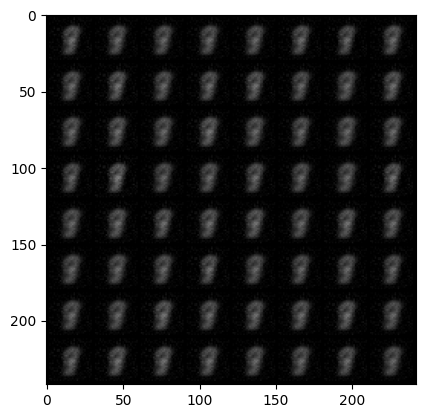

Epoch [1/80] Batch 0/938             Loss D: 0.3496, Loss G: 2.1663
Epoch [1/80] Batch 100/938             Loss D: 2.9297, Loss G: 6.9761
Epoch [1/80] Batch 200/938             Loss D: 0.5424, Loss G: 3.1615
Epoch [1/80] Batch 300/938             Loss D: 0.7416, Loss G: 1.4041
Epoch [1/80] Batch 400/938             Loss D: 0.6248, Loss G: 2.2055
Epoch [1/80] Batch 500/938             Loss D: 0.3001, Loss G: 2.2258
Epoch [1/80] Batch 600/938             Loss D: 0.6407, Loss G: 1.8112
Epoch [1/80] Batch 700/938             Loss D: 0.7575, Loss G: 1.8247
Epoch [1/80] Batch 800/938             Loss D: 0.2442, Loss G: 1.9226
Epoch [1/80] Batch 900/938             Loss D: 4.0890, Loss G: 1.6343


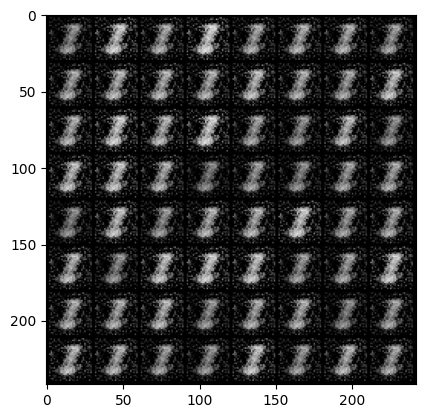

Epoch [2/80] Batch 0/938             Loss D: 0.4203, Loss G: 2.0385
Epoch [2/80] Batch 100/938             Loss D: 0.3833, Loss G: 2.4797
Epoch [2/80] Batch 200/938             Loss D: 1.0865, Loss G: 2.1972
Epoch [2/80] Batch 300/938             Loss D: 0.6497, Loss G: 1.9148
Epoch [2/80] Batch 400/938             Loss D: 0.3053, Loss G: 1.7961
Epoch [2/80] Batch 500/938             Loss D: 0.6856, Loss G: 3.1778
Epoch [2/80] Batch 600/938             Loss D: 0.5307, Loss G: 2.7767
Epoch [2/80] Batch 700/938             Loss D: 0.2818, Loss G: 3.0870
Epoch [2/80] Batch 800/938             Loss D: 2.9699, Loss G: 4.2613
Epoch [2/80] Batch 900/938             Loss D: 0.5407, Loss G: 2.3819


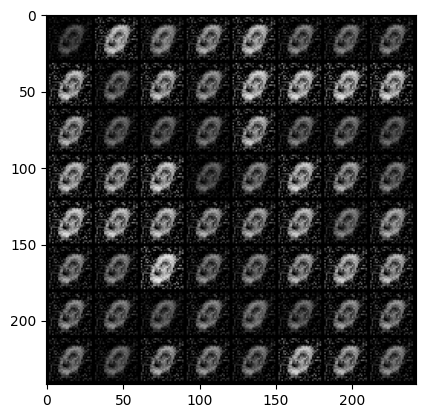

Epoch [3/80] Batch 0/938             Loss D: 0.5229, Loss G: 3.4676
Epoch [3/80] Batch 100/938             Loss D: 0.2131, Loss G: 2.9780
Epoch [3/80] Batch 200/938             Loss D: 1.3018, Loss G: 2.5666
Epoch [3/80] Batch 300/938             Loss D: 0.3486, Loss G: 2.0291
Epoch [3/80] Batch 400/938             Loss D: 1.3701, Loss G: 2.9551
Epoch [3/80] Batch 500/938             Loss D: 0.2772, Loss G: 2.5664
Epoch [3/80] Batch 600/938             Loss D: 0.5036, Loss G: 1.9649
Epoch [3/80] Batch 700/938             Loss D: 1.4322, Loss G: 2.2544
Epoch [3/80] Batch 800/938             Loss D: 0.5583, Loss G: 1.8254
Epoch [3/80] Batch 900/938             Loss D: 0.1942, Loss G: 3.1506


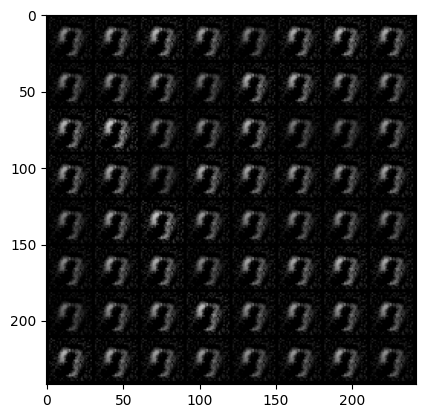

Epoch [4/80] Batch 0/938             Loss D: 0.1580, Loss G: 4.2035
Epoch [4/80] Batch 100/938             Loss D: 1.5059, Loss G: 3.0940
Epoch [4/80] Batch 200/938             Loss D: 0.1414, Loss G: 3.1634
Epoch [4/80] Batch 300/938             Loss D: 0.1214, Loss G: 4.1873
Epoch [4/80] Batch 400/938             Loss D: 0.8846, Loss G: 2.2264
Epoch [4/80] Batch 500/938             Loss D: 0.4652, Loss G: 3.6181
Epoch [4/80] Batch 600/938             Loss D: 0.5223, Loss G: 3.9314
Epoch [4/80] Batch 700/938             Loss D: 0.1481, Loss G: 3.2733
Epoch [4/80] Batch 800/938             Loss D: 0.2748, Loss G: 2.5770
Epoch [4/80] Batch 900/938             Loss D: 0.9033, Loss G: 2.4162


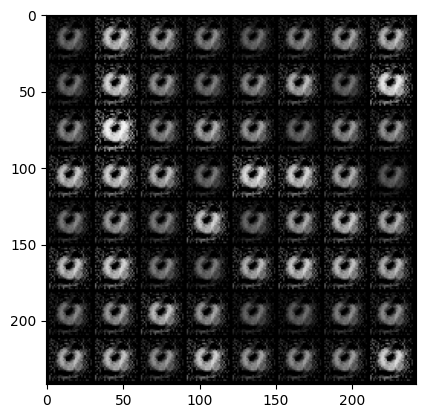

Epoch [5/80] Batch 0/938             Loss D: 0.1811, Loss G: 2.5247
Epoch [5/80] Batch 100/938             Loss D: 1.1058, Loss G: 4.0222
Epoch [5/80] Batch 200/938             Loss D: 0.4294, Loss G: 2.2543
Epoch [5/80] Batch 300/938             Loss D: 0.1895, Loss G: 3.2417
Epoch [5/80] Batch 400/938             Loss D: 0.7454, Loss G: 1.4588
Epoch [5/80] Batch 500/938             Loss D: 0.1649, Loss G: 2.1905
Epoch [5/80] Batch 600/938             Loss D: 0.1282, Loss G: 3.2709
Epoch [5/80] Batch 700/938             Loss D: 0.8457, Loss G: 3.4540
Epoch [5/80] Batch 800/938             Loss D: 2.2605, Loss G: 2.4774
Epoch [5/80] Batch 900/938             Loss D: 0.5950, Loss G: 2.7837


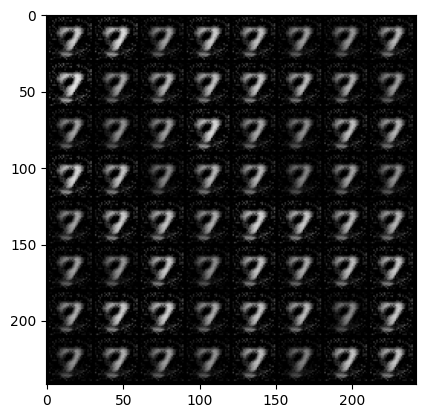

Epoch [6/80] Batch 0/938             Loss D: 0.2463, Loss G: 2.7438
Epoch [6/80] Batch 100/938             Loss D: 0.1602, Loss G: 3.9387
Epoch [6/80] Batch 200/938             Loss D: 1.0544, Loss G: 4.2796
Epoch [6/80] Batch 300/938             Loss D: 0.6365, Loss G: 2.1952
Epoch [6/80] Batch 400/938             Loss D: 0.1973, Loss G: 3.1682
Epoch [6/80] Batch 500/938             Loss D: 0.4112, Loss G: 4.2405
Epoch [6/80] Batch 600/938             Loss D: 1.2385, Loss G: 3.0784
Epoch [6/80] Batch 700/938             Loss D: 0.6920, Loss G: 2.0402
Epoch [6/80] Batch 800/938             Loss D: 0.8571, Loss G: 6.2675
Epoch [6/80] Batch 900/938             Loss D: 0.2594, Loss G: 2.9910


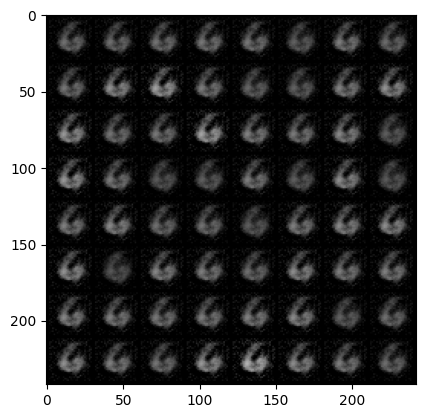

Epoch [7/80] Batch 0/938             Loss D: 0.3475, Loss G: 3.4250
Epoch [7/80] Batch 100/938             Loss D: 0.3089, Loss G: 3.6882
Epoch [7/80] Batch 200/938             Loss D: 0.3954, Loss G: 2.5105
Epoch [7/80] Batch 300/938             Loss D: 0.1916, Loss G: 2.5994
Epoch [7/80] Batch 400/938             Loss D: 0.1242, Loss G: 3.5321
Epoch [7/80] Batch 500/938             Loss D: 0.6906, Loss G: 3.6437
Epoch [7/80] Batch 600/938             Loss D: 0.3610, Loss G: 2.2873
Epoch [7/80] Batch 700/938             Loss D: 0.3231, Loss G: 4.5041
Epoch [7/80] Batch 800/938             Loss D: 0.2314, Loss G: 3.4143
Epoch [7/80] Batch 900/938             Loss D: 0.6254, Loss G: 2.7653


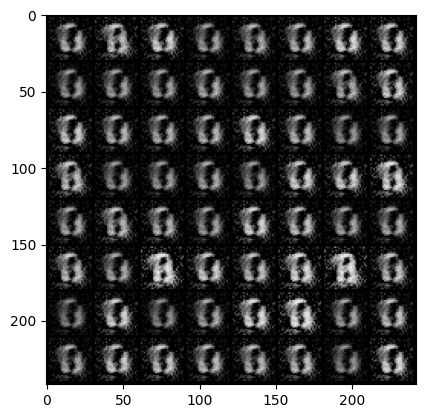

Epoch [8/80] Batch 0/938             Loss D: 0.2752, Loss G: 3.6584
Epoch [8/80] Batch 100/938             Loss D: 0.8255, Loss G: 3.0262
Epoch [8/80] Batch 200/938             Loss D: 0.5114, Loss G: 2.1385
Epoch [8/80] Batch 300/938             Loss D: 0.4615, Loss G: 4.7306
Epoch [8/80] Batch 400/938             Loss D: 0.7824, Loss G: 3.2965
Epoch [8/80] Batch 500/938             Loss D: 0.2545, Loss G: 3.8607
Epoch [8/80] Batch 600/938             Loss D: 0.1582, Loss G: 4.5967
Epoch [8/80] Batch 700/938             Loss D: 0.2961, Loss G: 2.8811
Epoch [8/80] Batch 800/938             Loss D: 0.2588, Loss G: 4.9181
Epoch [8/80] Batch 900/938             Loss D: 1.4800, Loss G: 3.5135


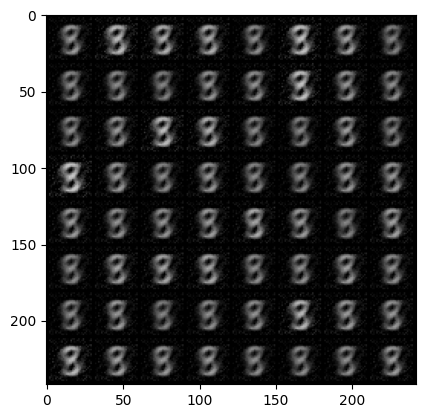

Epoch [9/80] Batch 0/938             Loss D: 0.2744, Loss G: 3.1590
Epoch [9/80] Batch 100/938             Loss D: 0.9854, Loss G: 3.5570
Epoch [9/80] Batch 200/938             Loss D: 0.8127, Loss G: 1.4860
Epoch [9/80] Batch 300/938             Loss D: 0.1545, Loss G: 4.6664
Epoch [9/80] Batch 400/938             Loss D: 1.3999, Loss G: 4.8516
Epoch [9/80] Batch 500/938             Loss D: 0.7847, Loss G: 2.6991
Epoch [9/80] Batch 600/938             Loss D: 0.3987, Loss G: 4.3656
Epoch [9/80] Batch 700/938             Loss D: 0.3108, Loss G: 3.5484
Epoch [9/80] Batch 800/938             Loss D: 0.2665, Loss G: 3.0690
Epoch [9/80] Batch 900/938             Loss D: 0.1511, Loss G: 3.0123


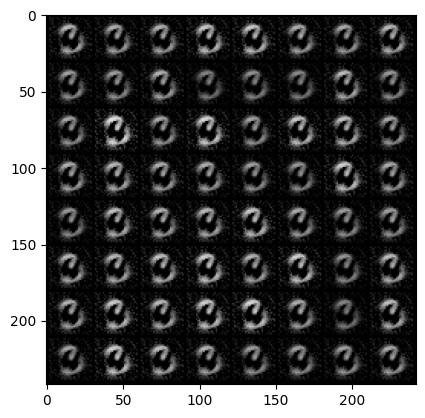

Epoch [10/80] Batch 0/938             Loss D: 0.1512, Loss G: 3.2538
Epoch [10/80] Batch 100/938             Loss D: 0.7336, Loss G: 4.3799
Epoch [10/80] Batch 200/938             Loss D: 0.3772, Loss G: 3.7562
Epoch [10/80] Batch 300/938             Loss D: 0.7862, Loss G: 4.6704
Epoch [10/80] Batch 400/938             Loss D: 0.5477, Loss G: 2.8723
Epoch [10/80] Batch 500/938             Loss D: 0.7269, Loss G: 2.2823
Epoch [10/80] Batch 600/938             Loss D: 0.2404, Loss G: 3.0892
Epoch [10/80] Batch 700/938             Loss D: 0.4466, Loss G: 4.9503
Epoch [10/80] Batch 800/938             Loss D: 0.2458, Loss G: 2.6770
Epoch [10/80] Batch 900/938             Loss D: 0.2669, Loss G: 4.4279


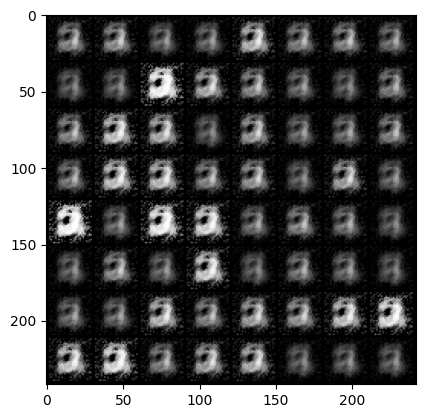

Epoch [11/80] Batch 0/938             Loss D: 0.7393, Loss G: 3.4342
Epoch [11/80] Batch 100/938             Loss D: 0.7296, Loss G: 1.7305
Epoch [11/80] Batch 200/938             Loss D: 0.5338, Loss G: 1.9144
Epoch [11/80] Batch 300/938             Loss D: 0.2969, Loss G: 8.3348
Epoch [11/80] Batch 400/938             Loss D: 0.5996, Loss G: 1.6324
Epoch [11/80] Batch 500/938             Loss D: 0.2152, Loss G: 4.1166
Epoch [11/80] Batch 600/938             Loss D: 0.9471, Loss G: 3.0299
Epoch [11/80] Batch 700/938             Loss D: 0.6341, Loss G: 4.5614
Epoch [11/80] Batch 800/938             Loss D: 0.2869, Loss G: 2.4062
Epoch [11/80] Batch 900/938             Loss D: 0.7873, Loss G: 6.4275


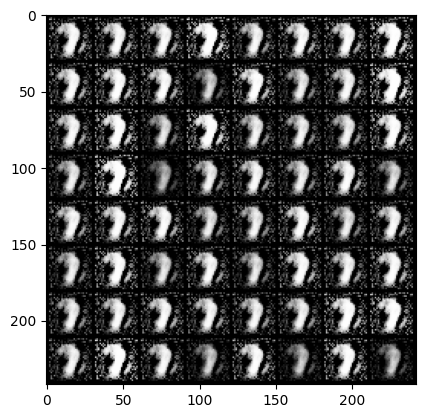

Epoch [12/80] Batch 0/938             Loss D: 1.7074, Loss G: 6.4232
Epoch [12/80] Batch 100/938             Loss D: 0.2858, Loss G: 2.6635
Epoch [12/80] Batch 200/938             Loss D: 0.3534, Loss G: 6.2859
Epoch [12/80] Batch 300/938             Loss D: 1.5177, Loss G: 2.4747
Epoch [12/80] Batch 400/938             Loss D: 1.9878, Loss G: 2.6658
Epoch [12/80] Batch 500/938             Loss D: 0.4565, Loss G: 2.7484
Epoch [12/80] Batch 600/938             Loss D: 1.3407, Loss G: 1.0795
Epoch [12/80] Batch 700/938             Loss D: 0.2209, Loss G: 2.7038
Epoch [12/80] Batch 800/938             Loss D: 0.5721, Loss G: 11.0660
Epoch [12/80] Batch 900/938             Loss D: 0.2460, Loss G: 4.0194


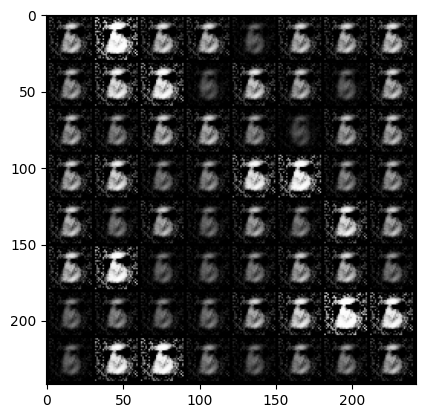

Epoch [13/80] Batch 0/938             Loss D: 0.6573, Loss G: 5.2369
Epoch [13/80] Batch 100/938             Loss D: 0.4028, Loss G: 3.0611
Epoch [13/80] Batch 200/938             Loss D: 0.3806, Loss G: 4.3011
Epoch [13/80] Batch 300/938             Loss D: 0.3038, Loss G: 3.7249
Epoch [13/80] Batch 400/938             Loss D: 0.4796, Loss G: 2.7990
Epoch [13/80] Batch 500/938             Loss D: 0.5164, Loss G: 3.7689
Epoch [13/80] Batch 600/938             Loss D: 0.5061, Loss G: 2.5134
Epoch [13/80] Batch 700/938             Loss D: 0.4899, Loss G: 1.6070
Epoch [13/80] Batch 800/938             Loss D: 0.2882, Loss G: 4.2696
Epoch [13/80] Batch 900/938             Loss D: 0.6019, Loss G: 6.1051


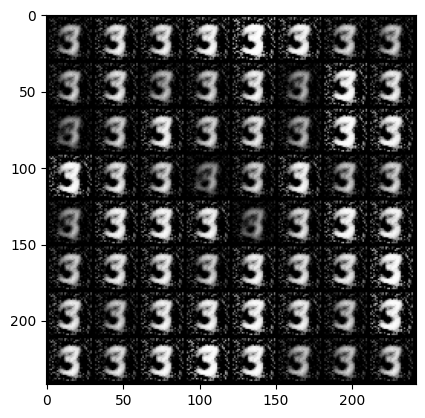

Epoch [14/80] Batch 0/938             Loss D: 0.2244, Loss G: 3.3435
Epoch [14/80] Batch 100/938             Loss D: 0.6529, Loss G: 2.8275
Epoch [14/80] Batch 200/938             Loss D: 0.6614, Loss G: 4.3736
Epoch [14/80] Batch 300/938             Loss D: 0.3862, Loss G: 3.0405
Epoch [14/80] Batch 400/938             Loss D: 0.4301, Loss G: 2.6337
Epoch [14/80] Batch 500/938             Loss D: 0.9625, Loss G: 3.9328
Epoch [14/80] Batch 600/938             Loss D: 0.1733, Loss G: 3.8417
Epoch [14/80] Batch 700/938             Loss D: 0.1496, Loss G: 2.9359
Epoch [14/80] Batch 800/938             Loss D: 0.8005, Loss G: 5.8768
Epoch [14/80] Batch 900/938             Loss D: 0.4567, Loss G: 2.8237


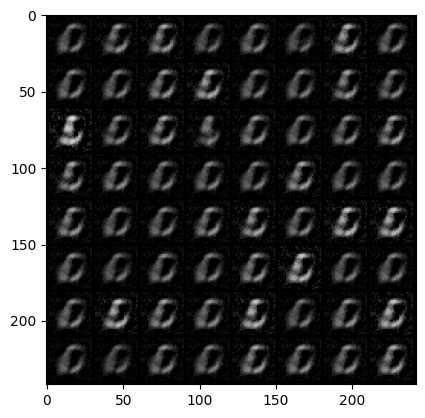

Epoch [15/80] Batch 0/938             Loss D: 0.4495, Loss G: 2.5119
Epoch [15/80] Batch 100/938             Loss D: 0.5614, Loss G: 4.1504
Epoch [15/80] Batch 200/938             Loss D: 0.5477, Loss G: 4.0134
Epoch [15/80] Batch 300/938             Loss D: 0.4572, Loss G: 5.3183
Epoch [15/80] Batch 400/938             Loss D: 0.6906, Loss G: 2.4010
Epoch [15/80] Batch 500/938             Loss D: 0.4788, Loss G: 2.7818
Epoch [15/80] Batch 600/938             Loss D: 0.9829, Loss G: 3.5642
Epoch [15/80] Batch 700/938             Loss D: 0.7127, Loss G: 2.4415
Epoch [15/80] Batch 800/938             Loss D: 0.5494, Loss G: 3.4708
Epoch [15/80] Batch 900/938             Loss D: 0.2053, Loss G: 3.2753


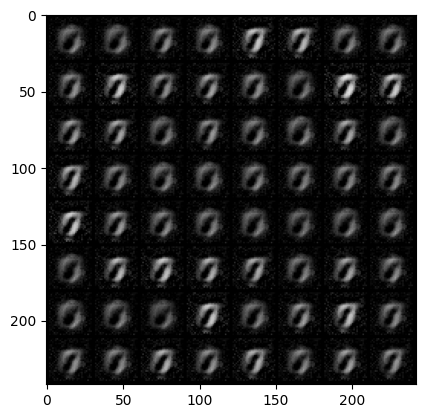

Epoch [16/80] Batch 0/938             Loss D: 0.8672, Loss G: 2.6727
Epoch [16/80] Batch 100/938             Loss D: 0.5904, Loss G: 3.6451
Epoch [16/80] Batch 200/938             Loss D: 0.4711, Loss G: 1.7749
Epoch [16/80] Batch 300/938             Loss D: 0.7775, Loss G: 4.4410
Epoch [16/80] Batch 400/938             Loss D: 0.6682, Loss G: 2.8552
Epoch [16/80] Batch 500/938             Loss D: 0.1893, Loss G: 5.0100
Epoch [16/80] Batch 600/938             Loss D: 0.1663, Loss G: 3.6914
Epoch [16/80] Batch 700/938             Loss D: 0.2567, Loss G: 4.5959
Epoch [16/80] Batch 800/938             Loss D: 0.7268, Loss G: 3.2301
Epoch [16/80] Batch 900/938             Loss D: 0.2127, Loss G: 4.0985


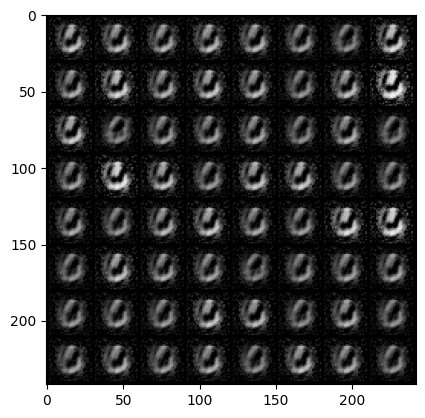

Epoch [17/80] Batch 0/938             Loss D: 0.3603, Loss G: 3.2062
Epoch [17/80] Batch 100/938             Loss D: 0.9483, Loss G: 4.7523
Epoch [17/80] Batch 200/938             Loss D: 0.4326, Loss G: 3.8440
Epoch [17/80] Batch 300/938             Loss D: 0.0431, Loss G: 3.9489
Epoch [17/80] Batch 400/938             Loss D: 0.8233, Loss G: 5.4510
Epoch [17/80] Batch 500/938             Loss D: 0.2862, Loss G: 3.5498
Epoch [17/80] Batch 600/938             Loss D: 0.7354, Loss G: 3.4928
Epoch [17/80] Batch 700/938             Loss D: 0.3315, Loss G: 3.6987
Epoch [17/80] Batch 800/938             Loss D: 0.5184, Loss G: 3.1418
Epoch [17/80] Batch 900/938             Loss D: 0.3884, Loss G: 2.7727


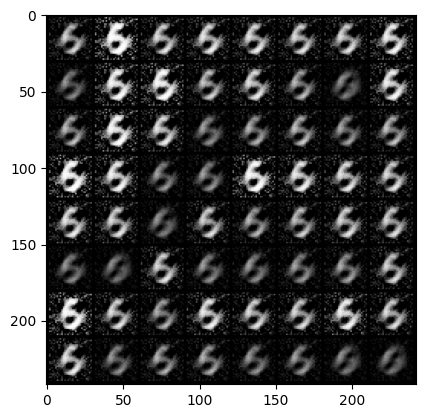

Epoch [18/80] Batch 0/938             Loss D: 0.2308, Loss G: 3.7155
Epoch [18/80] Batch 100/938             Loss D: 0.4179, Loss G: 6.0039
Epoch [18/80] Batch 200/938             Loss D: 0.3340, Loss G: 4.8272
Epoch [18/80] Batch 300/938             Loss D: 0.6663, Loss G: 1.9528
Epoch [18/80] Batch 400/938             Loss D: 0.2284, Loss G: 4.8990
Epoch [18/80] Batch 500/938             Loss D: 0.3470, Loss G: 2.3909
Epoch [18/80] Batch 600/938             Loss D: 0.1999, Loss G: 3.5175
Epoch [18/80] Batch 700/938             Loss D: 0.2929, Loss G: 2.7241
Epoch [18/80] Batch 800/938             Loss D: 0.4199, Loss G: 4.1825
Epoch [18/80] Batch 900/938             Loss D: 0.6593, Loss G: 2.9734


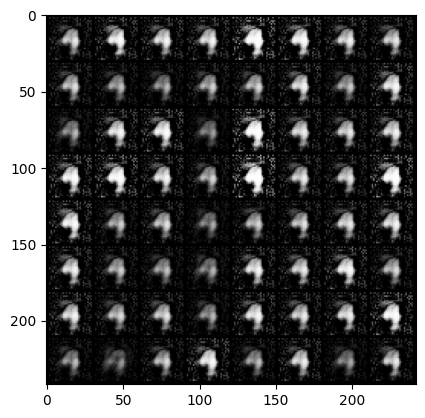

Epoch [19/80] Batch 0/938             Loss D: 0.2416, Loss G: 4.2390
Epoch [19/80] Batch 100/938             Loss D: 0.3677, Loss G: 3.2558
Epoch [19/80] Batch 200/938             Loss D: 0.6517, Loss G: 3.7545
Epoch [19/80] Batch 300/938             Loss D: 0.3614, Loss G: 3.0937
Epoch [19/80] Batch 400/938             Loss D: 0.3884, Loss G: 5.9676
Epoch [19/80] Batch 500/938             Loss D: 0.2479, Loss G: 4.6208
Epoch [19/80] Batch 600/938             Loss D: 0.2122, Loss G: 4.1083
Epoch [19/80] Batch 700/938             Loss D: 0.6786, Loss G: 4.3099
Epoch [19/80] Batch 800/938             Loss D: 0.1734, Loss G: 3.1308
Epoch [19/80] Batch 900/938             Loss D: 1.1250, Loss G: 3.6585


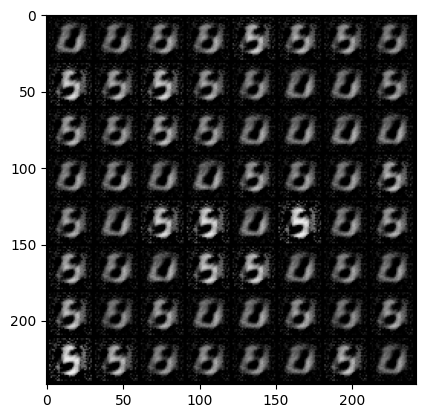

Epoch [20/80] Batch 0/938             Loss D: 0.2546, Loss G: 3.3761
Epoch [20/80] Batch 100/938             Loss D: 1.1782, Loss G: 2.5304
Epoch [20/80] Batch 200/938             Loss D: 1.0187, Loss G: 2.7380
Epoch [20/80] Batch 300/938             Loss D: 0.2440, Loss G: 2.9517
Epoch [20/80] Batch 400/938             Loss D: 0.3677, Loss G: 4.2816
Epoch [20/80] Batch 500/938             Loss D: 0.9724, Loss G: 1.9859
Epoch [20/80] Batch 600/938             Loss D: 0.4122, Loss G: 2.8357
Epoch [20/80] Batch 700/938             Loss D: 0.3816, Loss G: 4.0238
Epoch [20/80] Batch 800/938             Loss D: 0.6157, Loss G: 3.8003
Epoch [20/80] Batch 900/938             Loss D: 0.5873, Loss G: 2.1358


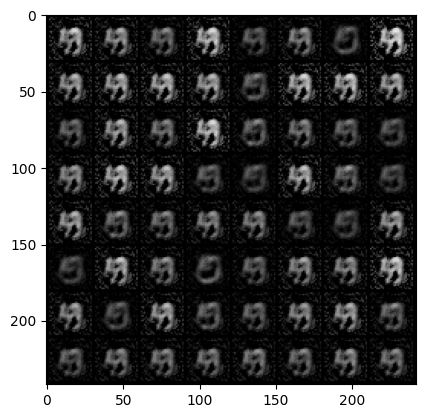

Epoch [21/80] Batch 0/938             Loss D: 0.2875, Loss G: 2.2713
Epoch [21/80] Batch 100/938             Loss D: 0.2596, Loss G: 4.1298
Epoch [21/80] Batch 200/938             Loss D: 0.3479, Loss G: 2.9363
Epoch [21/80] Batch 300/938             Loss D: 1.4635, Loss G: 3.1636
Epoch [21/80] Batch 400/938             Loss D: 0.3236, Loss G: 3.8650
Epoch [21/80] Batch 500/938             Loss D: 0.1430, Loss G: 6.2230
Epoch [21/80] Batch 600/938             Loss D: 0.2597, Loss G: 3.5736
Epoch [21/80] Batch 700/938             Loss D: 0.0292, Loss G: 5.0344
Epoch [21/80] Batch 800/938             Loss D: 0.6179, Loss G: 3.3932
Epoch [21/80] Batch 900/938             Loss D: 0.3800, Loss G: 3.9332


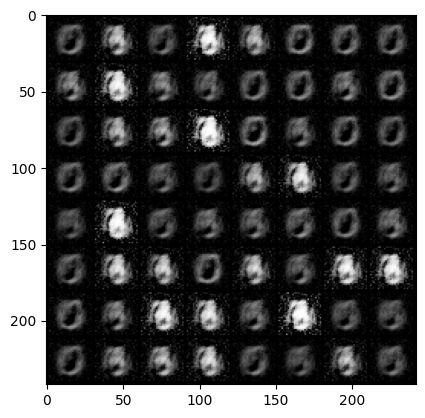

Epoch [22/80] Batch 0/938             Loss D: 0.6073, Loss G: 2.6494
Epoch [22/80] Batch 100/938             Loss D: 0.3230, Loss G: 4.3402
Epoch [22/80] Batch 200/938             Loss D: 0.2532, Loss G: 4.1038
Epoch [22/80] Batch 300/938             Loss D: 1.0165, Loss G: 3.8796
Epoch [22/80] Batch 400/938             Loss D: 0.7306, Loss G: 3.7325
Epoch [22/80] Batch 500/938             Loss D: 0.8449, Loss G: 4.0838
Epoch [22/80] Batch 600/938             Loss D: 0.1802, Loss G: 4.2142
Epoch [22/80] Batch 700/938             Loss D: 0.4986, Loss G: 2.4705
Epoch [22/80] Batch 800/938             Loss D: 0.6440, Loss G: 2.5032
Epoch [22/80] Batch 900/938             Loss D: 0.4554, Loss G: 4.8070


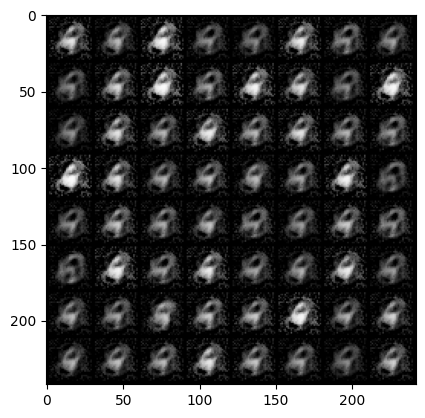

Epoch [23/80] Batch 0/938             Loss D: 0.7393, Loss G: 3.1239
Epoch [23/80] Batch 100/938             Loss D: 0.3042, Loss G: 2.9985
Epoch [23/80] Batch 200/938             Loss D: 0.6939, Loss G: 2.5534
Epoch [23/80] Batch 300/938             Loss D: 0.3846, Loss G: 3.5577
Epoch [23/80] Batch 400/938             Loss D: 0.6294, Loss G: 2.7117
Epoch [23/80] Batch 500/938             Loss D: 1.0004, Loss G: 4.2345
Epoch [23/80] Batch 600/938             Loss D: 0.3106, Loss G: 6.0634
Epoch [23/80] Batch 700/938             Loss D: 0.3980, Loss G: 2.0688
Epoch [23/80] Batch 800/938             Loss D: 0.6317, Loss G: 4.8974
Epoch [23/80] Batch 900/938             Loss D: 0.5063, Loss G: 3.6092


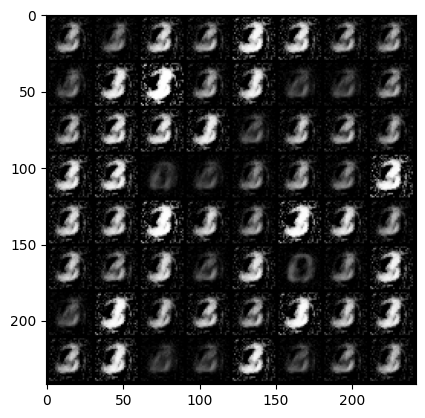

Epoch [24/80] Batch 0/938             Loss D: 2.0969, Loss G: 6.2822
Epoch [24/80] Batch 100/938             Loss D: 0.3968, Loss G: 2.6999
Epoch [24/80] Batch 200/938             Loss D: 0.8226, Loss G: 5.1571
Epoch [24/80] Batch 300/938             Loss D: 0.4589, Loss G: 3.1253
Epoch [24/80] Batch 400/938             Loss D: 0.1648, Loss G: 4.3660
Epoch [24/80] Batch 500/938             Loss D: 1.3395, Loss G: 2.4003
Epoch [24/80] Batch 600/938             Loss D: 0.3208, Loss G: 2.5499
Epoch [24/80] Batch 700/938             Loss D: 0.2357, Loss G: 4.1841
Epoch [24/80] Batch 800/938             Loss D: 0.2639, Loss G: 4.1293
Epoch [24/80] Batch 900/938             Loss D: 0.5282, Loss G: 3.5722


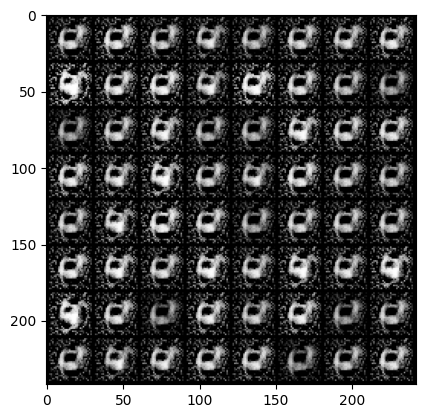

Epoch [25/80] Batch 0/938             Loss D: 0.4260, Loss G: 10.4189
Epoch [25/80] Batch 100/938             Loss D: 0.3320, Loss G: 3.7393
Epoch [25/80] Batch 200/938             Loss D: 0.3263, Loss G: 3.2456
Epoch [25/80] Batch 300/938             Loss D: 0.5137, Loss G: 3.2420
Epoch [25/80] Batch 400/938             Loss D: 0.5396, Loss G: 3.5495
Epoch [25/80] Batch 500/938             Loss D: 0.3963, Loss G: 4.3680
Epoch [25/80] Batch 600/938             Loss D: 0.5225, Loss G: 4.3988
Epoch [25/80] Batch 700/938             Loss D: 0.8831, Loss G: 3.7219
Epoch [25/80] Batch 800/938             Loss D: 0.3171, Loss G: 2.2932
Epoch [25/80] Batch 900/938             Loss D: 0.1088, Loss G: 4.6094


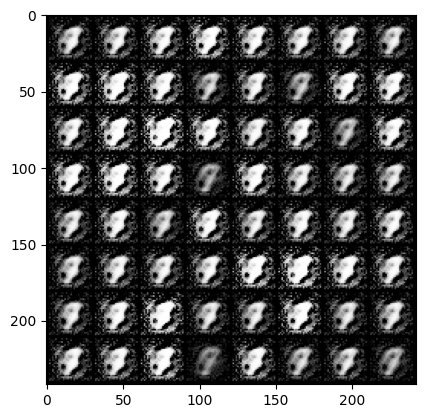

Epoch [26/80] Batch 0/938             Loss D: 1.0158, Loss G: 5.9451
Epoch [26/80] Batch 100/938             Loss D: 0.3847, Loss G: 2.4904
Epoch [26/80] Batch 200/938             Loss D: 0.1553, Loss G: 3.3386
Epoch [26/80] Batch 300/938             Loss D: 0.3831, Loss G: 2.7927
Epoch [26/80] Batch 400/938             Loss D: 0.3278, Loss G: 2.5473
Epoch [26/80] Batch 500/938             Loss D: 0.4064, Loss G: 3.7637
Epoch [26/80] Batch 600/938             Loss D: 0.4192, Loss G: 4.5235
Epoch [26/80] Batch 700/938             Loss D: 0.2853, Loss G: 4.9890
Epoch [26/80] Batch 800/938             Loss D: 0.5416, Loss G: 5.3367
Epoch [26/80] Batch 900/938             Loss D: 0.0926, Loss G: 5.5150


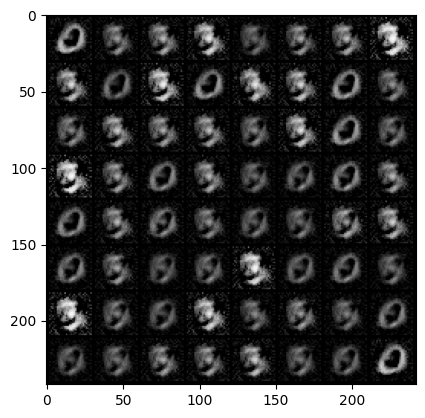

Epoch [27/80] Batch 0/938             Loss D: 0.4845, Loss G: 2.9781
Epoch [27/80] Batch 100/938             Loss D: 0.2815, Loss G: 4.1852
Epoch [27/80] Batch 200/938             Loss D: 0.9739, Loss G: 4.7341
Epoch [27/80] Batch 300/938             Loss D: 0.1576, Loss G: 3.2945
Epoch [27/80] Batch 400/938             Loss D: 0.2013, Loss G: 7.3871
Epoch [27/80] Batch 500/938             Loss D: 0.7072, Loss G: 3.9352
Epoch [27/80] Batch 600/938             Loss D: 0.4034, Loss G: 7.0233
Epoch [27/80] Batch 700/938             Loss D: 0.7647, Loss G: 6.3115
Epoch [27/80] Batch 800/938             Loss D: 0.2254, Loss G: 3.4087
Epoch [27/80] Batch 900/938             Loss D: 0.1727, Loss G: 5.8746


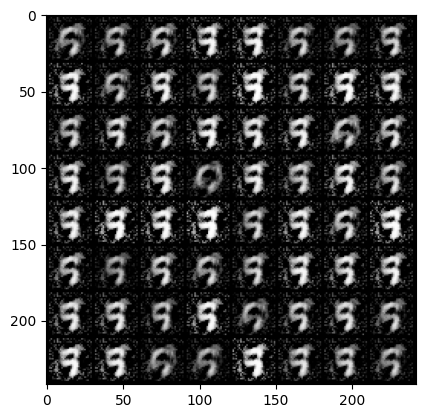

Epoch [28/80] Batch 0/938             Loss D: 0.4364, Loss G: 3.0903
Epoch [28/80] Batch 100/938             Loss D: 0.3946, Loss G: 4.9536
Epoch [28/80] Batch 200/938             Loss D: 0.0609, Loss G: 5.3614
Epoch [28/80] Batch 300/938             Loss D: 0.3981, Loss G: 3.2924
Epoch [28/80] Batch 400/938             Loss D: 0.6119, Loss G: 2.3750
Epoch [28/80] Batch 500/938             Loss D: 0.2859, Loss G: 4.0401
Epoch [28/80] Batch 600/938             Loss D: 0.5688, Loss G: 5.2456
Epoch [28/80] Batch 700/938             Loss D: 0.2066, Loss G: 2.6953
Epoch [28/80] Batch 800/938             Loss D: 0.1537, Loss G: 3.9894
Epoch [28/80] Batch 900/938             Loss D: 0.1489, Loss G: 3.7395


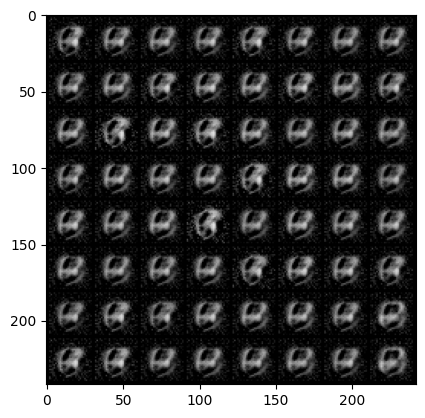

Epoch [29/80] Batch 0/938             Loss D: 0.1740, Loss G: 3.5166
Epoch [29/80] Batch 100/938             Loss D: 0.0982, Loss G: 5.5311
Epoch [29/80] Batch 200/938             Loss D: 0.1876, Loss G: 4.3645
Epoch [29/80] Batch 300/938             Loss D: 0.2780, Loss G: 4.5165
Epoch [29/80] Batch 400/938             Loss D: 0.3159, Loss G: 3.6558
Epoch [29/80] Batch 500/938             Loss D: 0.7886, Loss G: 5.2314
Epoch [29/80] Batch 600/938             Loss D: 0.3148, Loss G: 4.3155
Epoch [29/80] Batch 700/938             Loss D: 0.4311, Loss G: 3.5798
Epoch [29/80] Batch 800/938             Loss D: 0.3205, Loss G: 4.8934
Epoch [29/80] Batch 900/938             Loss D: 0.1930, Loss G: 3.3963


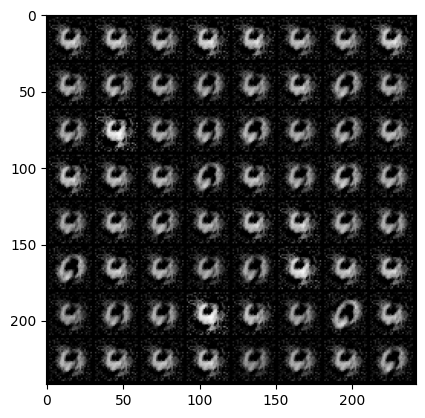

Epoch [30/80] Batch 0/938             Loss D: 0.1826, Loss G: 4.3971
Epoch [30/80] Batch 100/938             Loss D: 0.7996, Loss G: 9.4062
Epoch [30/80] Batch 200/938             Loss D: 0.6398, Loss G: 3.0206
Epoch [30/80] Batch 300/938             Loss D: 0.6295, Loss G: 4.0774
Epoch [30/80] Batch 400/938             Loss D: 0.6979, Loss G: 2.4107
Epoch [30/80] Batch 500/938             Loss D: 0.5533, Loss G: 2.4423
Epoch [30/80] Batch 600/938             Loss D: 0.3928, Loss G: 3.8013
Epoch [30/80] Batch 700/938             Loss D: 0.6355, Loss G: 3.6658
Epoch [30/80] Batch 800/938             Loss D: 0.5472, Loss G: 3.4523
Epoch [30/80] Batch 900/938             Loss D: 0.3510, Loss G: 5.2759


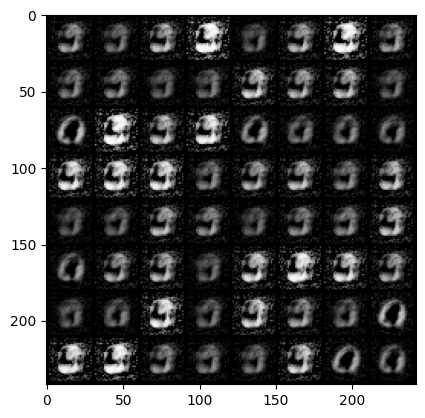

Epoch [31/80] Batch 0/938             Loss D: 0.4218, Loss G: 2.9547
Epoch [31/80] Batch 100/938             Loss D: 0.3409, Loss G: 4.1036
Epoch [31/80] Batch 200/938             Loss D: 0.4900, Loss G: 7.8509
Epoch [31/80] Batch 300/938             Loss D: 0.3385, Loss G: 2.4576
Epoch [31/80] Batch 400/938             Loss D: 0.0861, Loss G: 5.9916
Epoch [31/80] Batch 500/938             Loss D: 0.3280, Loss G: 3.6865
Epoch [31/80] Batch 600/938             Loss D: 0.5891, Loss G: 2.7828
Epoch [31/80] Batch 700/938             Loss D: 0.1397, Loss G: 5.5693
Epoch [31/80] Batch 800/938             Loss D: 0.2700, Loss G: 3.5657
Epoch [31/80] Batch 900/938             Loss D: 0.4577, Loss G: 4.2022


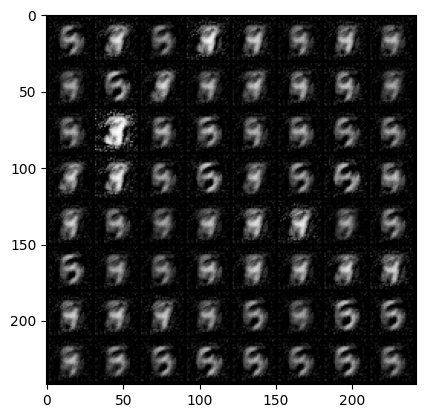

Epoch [32/80] Batch 0/938             Loss D: 0.6920, Loss G: 2.8681
Epoch [32/80] Batch 100/938             Loss D: 0.2106, Loss G: 4.5645
Epoch [32/80] Batch 200/938             Loss D: 0.3547, Loss G: 4.1196
Epoch [32/80] Batch 300/938             Loss D: 0.3607, Loss G: 3.0379
Epoch [32/80] Batch 400/938             Loss D: 0.2291, Loss G: 4.9926
Epoch [32/80] Batch 500/938             Loss D: 0.5551, Loss G: 4.6018
Epoch [32/80] Batch 600/938             Loss D: 0.4246, Loss G: 5.0788
Epoch [32/80] Batch 700/938             Loss D: 0.2046, Loss G: 5.2164
Epoch [32/80] Batch 800/938             Loss D: 0.7994, Loss G: 4.9937
Epoch [32/80] Batch 900/938             Loss D: 0.4344, Loss G: 3.9674


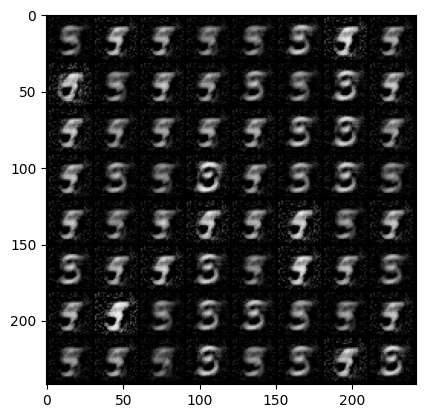

Epoch [33/80] Batch 0/938             Loss D: 0.3136, Loss G: 3.8892
Epoch [33/80] Batch 100/938             Loss D: 0.0623, Loss G: 4.7971
Epoch [33/80] Batch 200/938             Loss D: 0.9322, Loss G: 4.5666
Epoch [33/80] Batch 300/938             Loss D: 0.5053, Loss G: 3.9230
Epoch [33/80] Batch 400/938             Loss D: 0.0617, Loss G: 7.4834
Epoch [33/80] Batch 500/938             Loss D: 0.5002, Loss G: 5.3889
Epoch [33/80] Batch 600/938             Loss D: 0.2839, Loss G: 4.2210
Epoch [33/80] Batch 700/938             Loss D: 0.3413, Loss G: 3.5560
Epoch [33/80] Batch 800/938             Loss D: 0.1262, Loss G: 3.5737
Epoch [33/80] Batch 900/938             Loss D: 0.0499, Loss G: 8.5744


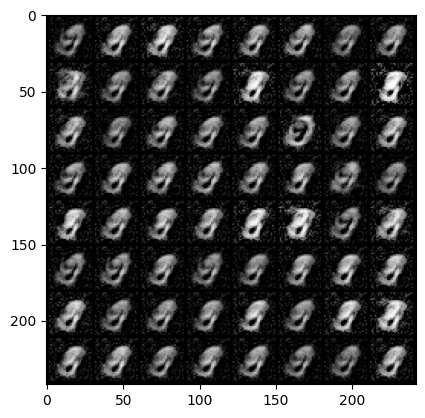

Epoch [34/80] Batch 0/938             Loss D: 0.5242, Loss G: 3.9557
Epoch [34/80] Batch 100/938             Loss D: 0.3040, Loss G: 3.5792
Epoch [34/80] Batch 200/938             Loss D: 0.4034, Loss G: 4.5269
Epoch [34/80] Batch 300/938             Loss D: 0.4511, Loss G: 2.8157
Epoch [34/80] Batch 400/938             Loss D: 0.9627, Loss G: 3.7858
Epoch [34/80] Batch 500/938             Loss D: 0.1519, Loss G: 3.2230
Epoch [34/80] Batch 600/938             Loss D: 0.1423, Loss G: 6.9467
Epoch [34/80] Batch 700/938             Loss D: 0.1497, Loss G: 5.6109
Epoch [34/80] Batch 800/938             Loss D: 0.1814, Loss G: 4.4622
Epoch [34/80] Batch 900/938             Loss D: 0.2350, Loss G: 5.9209


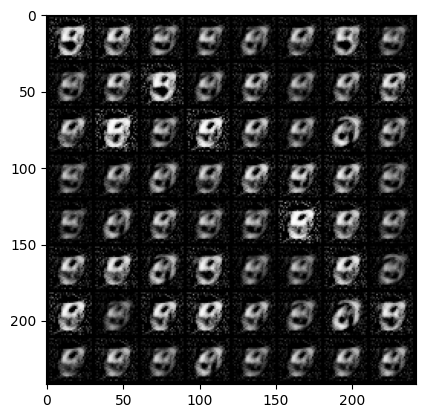

Epoch [35/80] Batch 0/938             Loss D: 0.4984, Loss G: 5.1039
Epoch [35/80] Batch 100/938             Loss D: 0.4244, Loss G: 3.5001
Epoch [35/80] Batch 200/938             Loss D: 0.1820, Loss G: 4.2095
Epoch [35/80] Batch 300/938             Loss D: 0.3234, Loss G: 5.0469
Epoch [35/80] Batch 400/938             Loss D: 0.3080, Loss G: 4.4363
Epoch [35/80] Batch 500/938             Loss D: 0.3545, Loss G: 4.2544
Epoch [35/80] Batch 600/938             Loss D: 0.4545, Loss G: 2.8809
Epoch [35/80] Batch 700/938             Loss D: 0.2018, Loss G: 3.8525
Epoch [35/80] Batch 800/938             Loss D: 0.1744, Loss G: 4.4897
Epoch [35/80] Batch 900/938             Loss D: 0.4012, Loss G: 3.7234


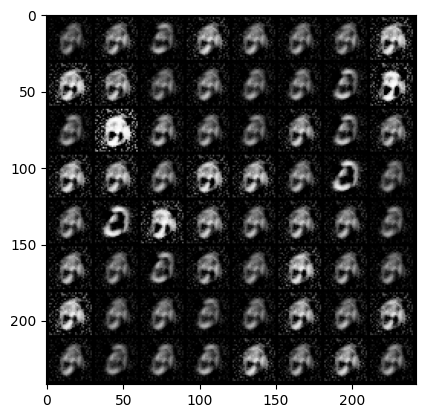

Epoch [36/80] Batch 0/938             Loss D: 0.3619, Loss G: 3.9029
Epoch [36/80] Batch 100/938             Loss D: 0.3465, Loss G: 4.5185
Epoch [36/80] Batch 200/938             Loss D: 0.3982, Loss G: 5.1598
Epoch [36/80] Batch 300/938             Loss D: 0.6640, Loss G: 2.7420
Epoch [36/80] Batch 400/938             Loss D: 0.4158, Loss G: 3.6670
Epoch [36/80] Batch 500/938             Loss D: 0.4229, Loss G: 3.0814
Epoch [36/80] Batch 600/938             Loss D: 0.3982, Loss G: 3.9622
Epoch [36/80] Batch 700/938             Loss D: 0.1313, Loss G: 4.9589
Epoch [36/80] Batch 800/938             Loss D: 0.4240, Loss G: 3.3486
Epoch [36/80] Batch 900/938             Loss D: 0.3443, Loss G: 3.9651


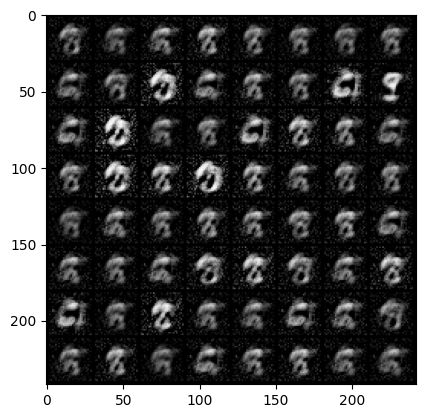

Epoch [37/80] Batch 0/938             Loss D: 0.2677, Loss G: 2.8352
Epoch [37/80] Batch 100/938             Loss D: 0.2921, Loss G: 3.7886
Epoch [37/80] Batch 200/938             Loss D: 0.4648, Loss G: 3.2852
Epoch [37/80] Batch 300/938             Loss D: 0.2155, Loss G: 8.7927
Epoch [37/80] Batch 400/938             Loss D: 0.2622, Loss G: 4.0492
Epoch [37/80] Batch 500/938             Loss D: 0.1823, Loss G: 5.2027
Epoch [37/80] Batch 600/938             Loss D: 0.5760, Loss G: 4.2064
Epoch [37/80] Batch 700/938             Loss D: 0.2241, Loss G: 3.5481
Epoch [37/80] Batch 800/938             Loss D: 0.1945, Loss G: 3.7052
Epoch [37/80] Batch 900/938             Loss D: 0.5151, Loss G: 3.4179


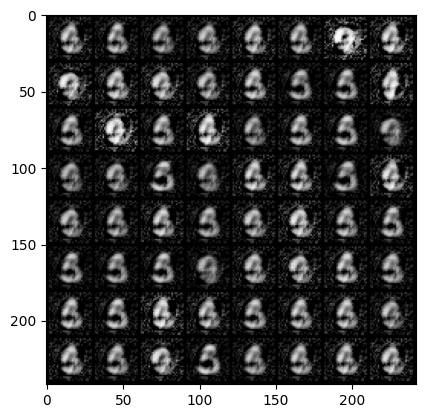

Epoch [38/80] Batch 0/938             Loss D: 0.1661, Loss G: 3.9948
Epoch [38/80] Batch 100/938             Loss D: 0.3895, Loss G: 4.3039
Epoch [38/80] Batch 200/938             Loss D: 0.2951, Loss G: 4.2214
Epoch [38/80] Batch 300/938             Loss D: 0.2521, Loss G: 3.8323
Epoch [38/80] Batch 400/938             Loss D: 0.5647, Loss G: 5.2040
Epoch [38/80] Batch 500/938             Loss D: 0.3193, Loss G: 3.7025
Epoch [38/80] Batch 600/938             Loss D: 0.2124, Loss G: 7.9347
Epoch [38/80] Batch 700/938             Loss D: 0.3748, Loss G: 3.4975
Epoch [38/80] Batch 800/938             Loss D: 0.2908, Loss G: 2.9214
Epoch [38/80] Batch 900/938             Loss D: 0.2888, Loss G: 3.3012


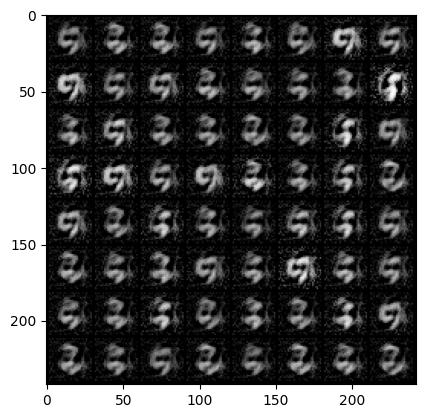

Epoch [39/80] Batch 0/938             Loss D: 0.3417, Loss G: 4.7482
Epoch [39/80] Batch 100/938             Loss D: 0.2390, Loss G: 6.1010
Epoch [39/80] Batch 200/938             Loss D: 0.3526, Loss G: 4.0103
Epoch [39/80] Batch 300/938             Loss D: 0.3885, Loss G: 4.1625
Epoch [39/80] Batch 400/938             Loss D: 0.2121, Loss G: 4.3688
Epoch [39/80] Batch 500/938             Loss D: 0.2194, Loss G: 4.9003
Epoch [39/80] Batch 600/938             Loss D: 0.4193, Loss G: 3.1150
Epoch [39/80] Batch 700/938             Loss D: 0.4371, Loss G: 3.1677
Epoch [39/80] Batch 800/938             Loss D: 0.3818, Loss G: 3.2305
Epoch [39/80] Batch 900/938             Loss D: 0.1894, Loss G: 5.2056


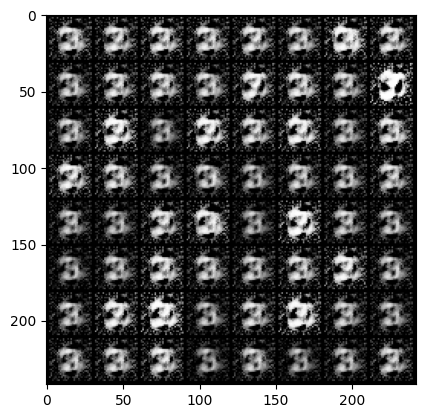

Epoch [40/80] Batch 0/938             Loss D: 0.2884, Loss G: 5.1430
Epoch [40/80] Batch 100/938             Loss D: 0.2548, Loss G: 3.8517
Epoch [40/80] Batch 200/938             Loss D: 0.4407, Loss G: 5.8232
Epoch [40/80] Batch 300/938             Loss D: 0.2047, Loss G: 5.4445
Epoch [40/80] Batch 400/938             Loss D: 0.2111, Loss G: 4.0617
Epoch [40/80] Batch 500/938             Loss D: 0.4504, Loss G: 4.3174
Epoch [40/80] Batch 600/938             Loss D: 0.1270, Loss G: 3.9413
Epoch [40/80] Batch 700/938             Loss D: 0.4087, Loss G: 3.2278
Epoch [40/80] Batch 800/938             Loss D: 0.3303, Loss G: 4.9657
Epoch [40/80] Batch 900/938             Loss D: 0.3094, Loss G: 4.5455


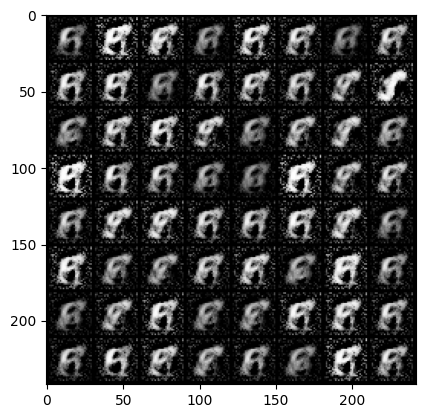

Epoch [41/80] Batch 0/938             Loss D: 0.1623, Loss G: 6.6974
Epoch [41/80] Batch 100/938             Loss D: 0.2129, Loss G: 5.1354
Epoch [41/80] Batch 200/938             Loss D: 0.2964, Loss G: 4.6119
Epoch [41/80] Batch 300/938             Loss D: 0.2205, Loss G: 3.9755
Epoch [41/80] Batch 400/938             Loss D: 0.2566, Loss G: 3.6690
Epoch [41/80] Batch 500/938             Loss D: 0.5866, Loss G: 5.5594
Epoch [41/80] Batch 600/938             Loss D: 0.1402, Loss G: 4.1757
Epoch [41/80] Batch 700/938             Loss D: 0.4484, Loss G: 5.4022
Epoch [41/80] Batch 800/938             Loss D: 0.5134, Loss G: 5.0702
Epoch [41/80] Batch 900/938             Loss D: 0.3219, Loss G: 4.3672


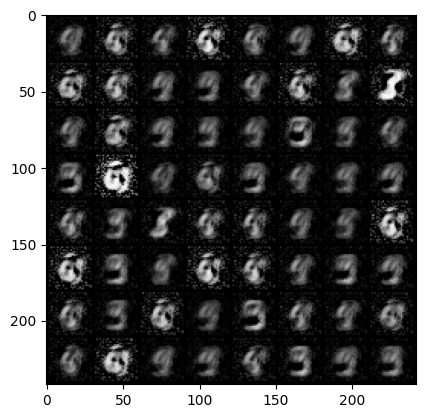

Epoch [42/80] Batch 0/938             Loss D: 0.2407, Loss G: 2.9614
Epoch [42/80] Batch 100/938             Loss D: 0.2097, Loss G: 3.7497
Epoch [42/80] Batch 200/938             Loss D: 0.4416, Loss G: 3.7433
Epoch [42/80] Batch 300/938             Loss D: 0.4986, Loss G: 5.1307
Epoch [42/80] Batch 400/938             Loss D: 0.3230, Loss G: 4.4567
Epoch [42/80] Batch 500/938             Loss D: 0.1532, Loss G: 5.2276
Epoch [42/80] Batch 600/938             Loss D: 0.3417, Loss G: 5.3089
Epoch [42/80] Batch 700/938             Loss D: 0.2500, Loss G: 2.7074
Epoch [42/80] Batch 800/938             Loss D: 0.2910, Loss G: 4.1739
Epoch [42/80] Batch 900/938             Loss D: 0.1611, Loss G: 6.8457


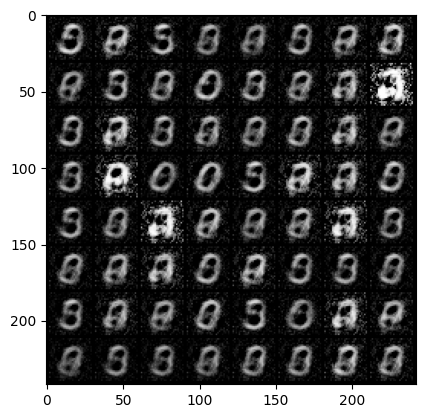

Epoch [43/80] Batch 0/938             Loss D: 0.2058, Loss G: 4.9849
Epoch [43/80] Batch 100/938             Loss D: 0.0407, Loss G: 6.0558
Epoch [43/80] Batch 200/938             Loss D: 0.1422, Loss G: 4.9368
Epoch [43/80] Batch 300/938             Loss D: 0.1468, Loss G: 4.3297
Epoch [43/80] Batch 400/938             Loss D: 0.0718, Loss G: 7.5420
Epoch [43/80] Batch 500/938             Loss D: 0.1706, Loss G: 4.8173
Epoch [43/80] Batch 600/938             Loss D: 0.4128, Loss G: 3.4137
Epoch [43/80] Batch 700/938             Loss D: 0.4258, Loss G: 4.4245
Epoch [43/80] Batch 800/938             Loss D: 0.2299, Loss G: 4.1175
Epoch [43/80] Batch 900/938             Loss D: 0.2351, Loss G: 5.5897


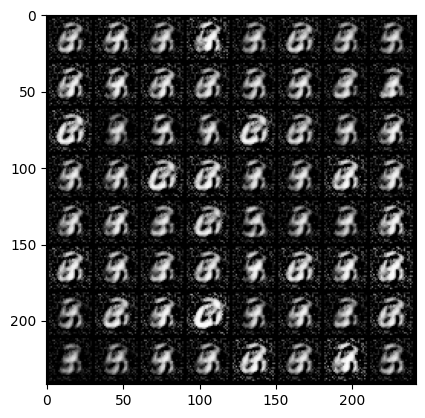

Epoch [44/80] Batch 0/938             Loss D: 0.1980, Loss G: 4.1382
Epoch [44/80] Batch 100/938             Loss D: 0.2241, Loss G: 5.7984
Epoch [44/80] Batch 200/938             Loss D: 0.1997, Loss G: 4.1177
Epoch [44/80] Batch 300/938             Loss D: 0.1350, Loss G: 4.6682
Epoch [44/80] Batch 400/938             Loss D: 0.4140, Loss G: 3.1344
Epoch [44/80] Batch 500/938             Loss D: 0.2659, Loss G: 3.4837
Epoch [44/80] Batch 600/938             Loss D: 0.3498, Loss G: 4.3941
Epoch [44/80] Batch 700/938             Loss D: 0.3084, Loss G: 3.6165
Epoch [44/80] Batch 800/938             Loss D: 0.2717, Loss G: 6.9399
Epoch [44/80] Batch 900/938             Loss D: 0.1244, Loss G: 3.9785


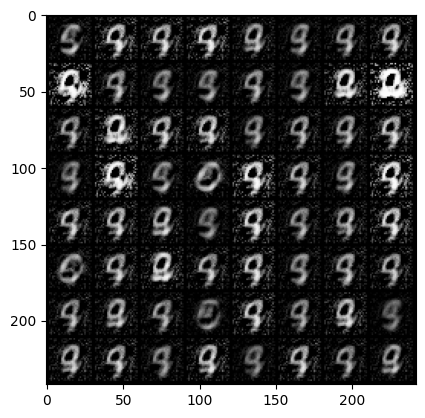

Epoch [45/80] Batch 0/938             Loss D: 0.5020, Loss G: 3.4203
Epoch [45/80] Batch 100/938             Loss D: 0.1289, Loss G: 4.8724
Epoch [45/80] Batch 200/938             Loss D: 0.2689, Loss G: 4.1658
Epoch [45/80] Batch 300/938             Loss D: 0.1047, Loss G: 4.9124
Epoch [45/80] Batch 400/938             Loss D: 0.5467, Loss G: 3.4517
Epoch [45/80] Batch 500/938             Loss D: 0.5547, Loss G: 4.0335
Epoch [45/80] Batch 600/938             Loss D: 0.0912, Loss G: 5.2484
Epoch [45/80] Batch 700/938             Loss D: 0.5333, Loss G: 4.0848
Epoch [45/80] Batch 800/938             Loss D: 0.2536, Loss G: 4.7179
Epoch [45/80] Batch 900/938             Loss D: 0.0584, Loss G: 5.8517


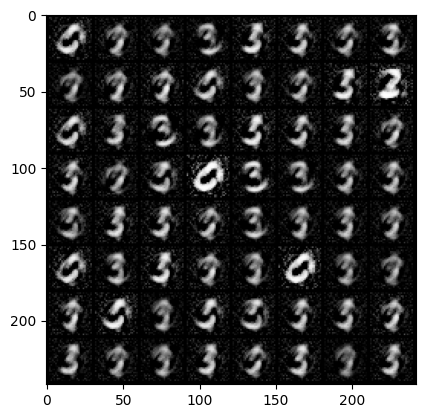

Epoch [46/80] Batch 0/938             Loss D: 0.1820, Loss G: 5.7406
Epoch [46/80] Batch 100/938             Loss D: 0.1756, Loss G: 5.3137
Epoch [46/80] Batch 200/938             Loss D: 0.3719, Loss G: 6.7459
Epoch [46/80] Batch 300/938             Loss D: 0.1113, Loss G: 4.7966
Epoch [46/80] Batch 400/938             Loss D: 0.3854, Loss G: 2.7726
Epoch [46/80] Batch 500/938             Loss D: 0.6192, Loss G: 3.5428
Epoch [46/80] Batch 600/938             Loss D: 0.2290, Loss G: 3.8022
Epoch [46/80] Batch 700/938             Loss D: 0.1790, Loss G: 3.4239
Epoch [46/80] Batch 800/938             Loss D: 0.2537, Loss G: 5.7205
Epoch [46/80] Batch 900/938             Loss D: 0.0362, Loss G: 5.6224


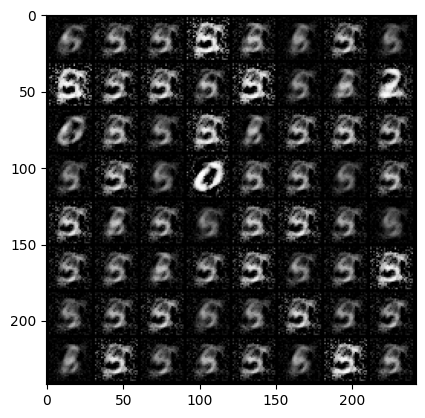

Epoch [47/80] Batch 0/938             Loss D: 0.2517, Loss G: 3.8116
Epoch [47/80] Batch 100/938             Loss D: 0.3354, Loss G: 3.9752
Epoch [47/80] Batch 200/938             Loss D: 0.2584, Loss G: 5.4698
Epoch [47/80] Batch 300/938             Loss D: 0.1962, Loss G: 4.6671
Epoch [47/80] Batch 400/938             Loss D: 0.4856, Loss G: 4.7430
Epoch [47/80] Batch 500/938             Loss D: 0.4216, Loss G: 4.5245
Epoch [47/80] Batch 600/938             Loss D: 0.1652, Loss G: 4.9128
Epoch [47/80] Batch 700/938             Loss D: 0.3592, Loss G: 3.9041
Epoch [47/80] Batch 800/938             Loss D: 0.0782, Loss G: 6.6807
Epoch [47/80] Batch 900/938             Loss D: 0.3955, Loss G: 5.8642


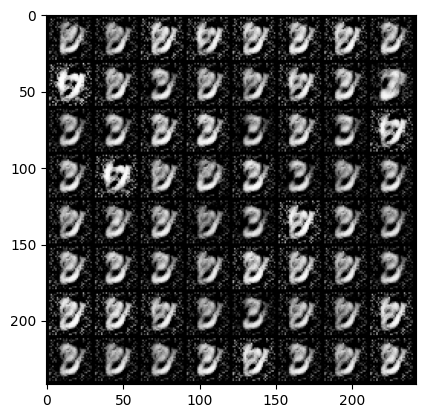

Epoch [48/80] Batch 0/938             Loss D: 0.4233, Loss G: 4.9781
Epoch [48/80] Batch 100/938             Loss D: 0.4133, Loss G: 3.7470
Epoch [48/80] Batch 200/938             Loss D: 0.0486, Loss G: 6.9049
Epoch [48/80] Batch 300/938             Loss D: 0.3055, Loss G: 4.0549
Epoch [48/80] Batch 400/938             Loss D: 0.1531, Loss G: 5.9670
Epoch [48/80] Batch 500/938             Loss D: 0.1563, Loss G: 4.5584
Epoch [48/80] Batch 600/938             Loss D: 0.4523, Loss G: 3.6442
Epoch [48/80] Batch 700/938             Loss D: 0.2441, Loss G: 3.8156
Epoch [48/80] Batch 800/938             Loss D: 0.3365, Loss G: 3.2016
Epoch [48/80] Batch 900/938             Loss D: 0.3739, Loss G: 4.7487


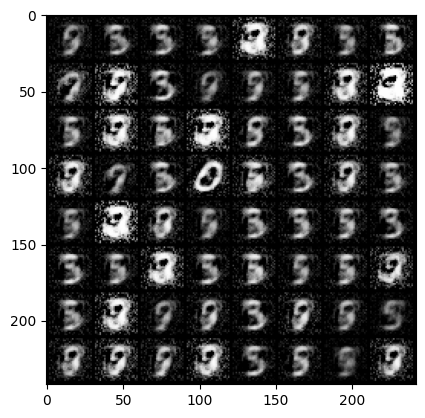

Epoch [49/80] Batch 0/938             Loss D: 0.1459, Loss G: 3.9275
Epoch [49/80] Batch 100/938             Loss D: 0.1185, Loss G: 4.7478
Epoch [49/80] Batch 200/938             Loss D: 0.3865, Loss G: 5.9408
Epoch [49/80] Batch 300/938             Loss D: 0.4182, Loss G: 4.6079
Epoch [49/80] Batch 400/938             Loss D: 0.2002, Loss G: 3.6500
Epoch [49/80] Batch 500/938             Loss D: 0.3815, Loss G: 3.9165
Epoch [49/80] Batch 600/938             Loss D: 0.2134, Loss G: 3.8861
Epoch [49/80] Batch 700/938             Loss D: 0.1195, Loss G: 4.6987
Epoch [49/80] Batch 800/938             Loss D: 0.3722, Loss G: 3.9276
Epoch [49/80] Batch 900/938             Loss D: 0.2200, Loss G: 4.7838


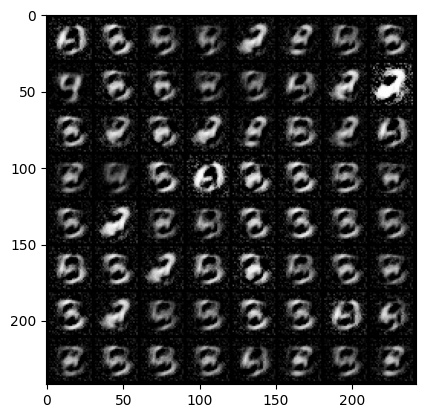

Epoch [50/80] Batch 0/938             Loss D: 0.3575, Loss G: 3.7138
Epoch [50/80] Batch 100/938             Loss D: 0.4056, Loss G: 4.2085
Epoch [50/80] Batch 200/938             Loss D: 0.3037, Loss G: 3.1086
Epoch [50/80] Batch 300/938             Loss D: 0.3785, Loss G: 4.5330
Epoch [50/80] Batch 400/938             Loss D: 0.1018, Loss G: 4.5585
Epoch [50/80] Batch 500/938             Loss D: 0.3663, Loss G: 4.2559
Epoch [50/80] Batch 600/938             Loss D: 0.4524, Loss G: 5.1431
Epoch [50/80] Batch 700/938             Loss D: 0.3809, Loss G: 3.6544
Epoch [50/80] Batch 800/938             Loss D: 0.6064, Loss G: 2.6796
Epoch [50/80] Batch 900/938             Loss D: 0.2451, Loss G: 3.9254


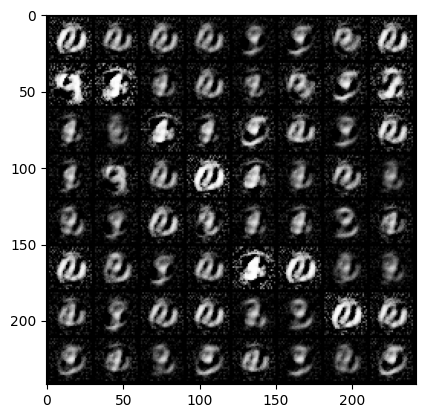

Epoch [51/80] Batch 0/938             Loss D: 0.3540, Loss G: 4.0788
Epoch [51/80] Batch 100/938             Loss D: 0.2007, Loss G: 5.2820
Epoch [51/80] Batch 200/938             Loss D: 0.2258, Loss G: 6.2584
Epoch [51/80] Batch 300/938             Loss D: 0.1251, Loss G: 5.3172
Epoch [51/80] Batch 400/938             Loss D: 0.0761, Loss G: 4.9097
Epoch [51/80] Batch 500/938             Loss D: 0.4409, Loss G: 4.6166
Epoch [51/80] Batch 600/938             Loss D: 0.2057, Loss G: 3.5333
Epoch [51/80] Batch 700/938             Loss D: 0.2274, Loss G: 5.4014
Epoch [51/80] Batch 800/938             Loss D: 0.1818, Loss G: 4.8689
Epoch [51/80] Batch 900/938             Loss D: 0.5476, Loss G: 4.3085


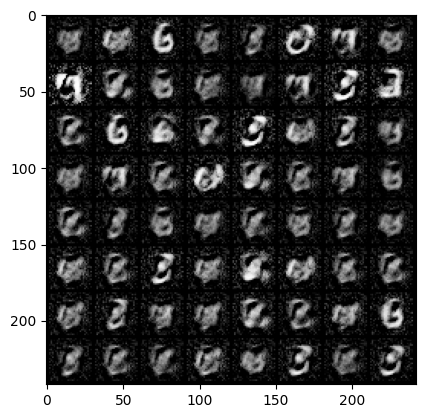

Epoch [52/80] Batch 0/938             Loss D: 0.3116, Loss G: 4.3438
Epoch [52/80] Batch 100/938             Loss D: 0.1619, Loss G: 4.7511
Epoch [52/80] Batch 200/938             Loss D: 0.2523, Loss G: 5.0143
Epoch [52/80] Batch 300/938             Loss D: 0.2153, Loss G: 4.1277
Epoch [52/80] Batch 400/938             Loss D: 0.2154, Loss G: 3.5778
Epoch [52/80] Batch 500/938             Loss D: 0.2317, Loss G: 4.3095
Epoch [52/80] Batch 600/938             Loss D: 0.1604, Loss G: 5.1994
Epoch [52/80] Batch 700/938             Loss D: 0.1988, Loss G: 4.1912
Epoch [52/80] Batch 800/938             Loss D: 0.3050, Loss G: 5.0413
Epoch [52/80] Batch 900/938             Loss D: 0.6482, Loss G: 5.6012


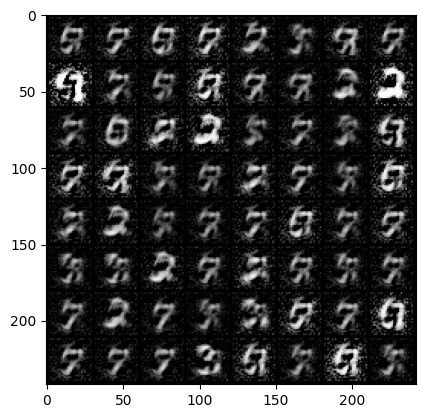

Epoch [53/80] Batch 0/938             Loss D: 0.2252, Loss G: 4.0286
Epoch [53/80] Batch 100/938             Loss D: 0.2972, Loss G: 3.4017
Epoch [53/80] Batch 200/938             Loss D: 0.2059, Loss G: 4.6215
Epoch [53/80] Batch 300/938             Loss D: 0.1213, Loss G: 3.8668
Epoch [53/80] Batch 400/938             Loss D: 0.2388, Loss G: 5.2006
Epoch [53/80] Batch 500/938             Loss D: 0.3165, Loss G: 4.3735
Epoch [53/80] Batch 600/938             Loss D: 0.0446, Loss G: 4.8821
Epoch [53/80] Batch 700/938             Loss D: 0.2556, Loss G: 4.2724
Epoch [53/80] Batch 800/938             Loss D: 0.1546, Loss G: 4.1362
Epoch [53/80] Batch 900/938             Loss D: 0.1507, Loss G: 4.7217


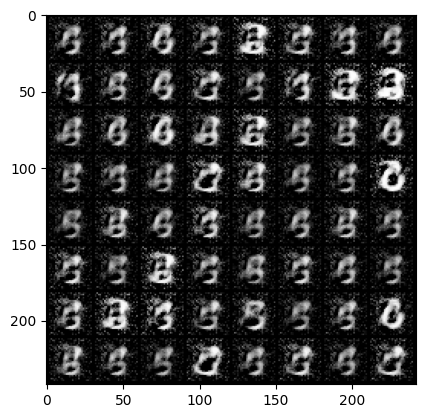

Epoch [54/80] Batch 0/938             Loss D: 0.1702, Loss G: 5.6811
Epoch [54/80] Batch 100/938             Loss D: 0.2412, Loss G: 4.4670
Epoch [54/80] Batch 200/938             Loss D: 0.1688, Loss G: 6.1580
Epoch [54/80] Batch 300/938             Loss D: 0.2609, Loss G: 5.1012
Epoch [54/80] Batch 400/938             Loss D: 0.4200, Loss G: 4.1489
Epoch [54/80] Batch 500/938             Loss D: 0.2628, Loss G: 3.9551
Epoch [54/80] Batch 600/938             Loss D: 0.1166, Loss G: 4.9318
Epoch [54/80] Batch 700/938             Loss D: 0.1005, Loss G: 5.4326
Epoch [54/80] Batch 800/938             Loss D: 0.1785, Loss G: 5.7180
Epoch [54/80] Batch 900/938             Loss D: 0.1480, Loss G: 4.2392


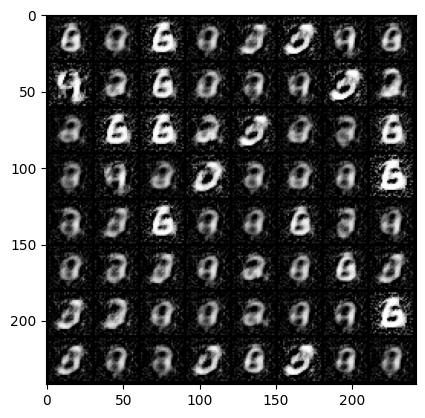

Epoch [55/80] Batch 0/938             Loss D: 0.1973, Loss G: 3.4959
Epoch [55/80] Batch 100/938             Loss D: 0.2312, Loss G: 5.0831
Epoch [55/80] Batch 200/938             Loss D: 0.2919, Loss G: 5.0511
Epoch [55/80] Batch 300/938             Loss D: 0.2281, Loss G: 5.2531
Epoch [55/80] Batch 400/938             Loss D: 0.2926, Loss G: 3.7934
Epoch [55/80] Batch 500/938             Loss D: 0.1620, Loss G: 4.5508
Epoch [55/80] Batch 600/938             Loss D: 0.0987, Loss G: 4.1748
Epoch [55/80] Batch 700/938             Loss D: 0.1077, Loss G: 5.0253
Epoch [55/80] Batch 800/938             Loss D: 0.1737, Loss G: 4.0505
Epoch [55/80] Batch 900/938             Loss D: 0.4079, Loss G: 4.0622


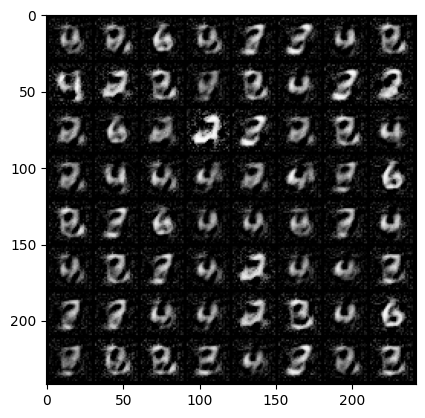

Epoch [56/80] Batch 0/938             Loss D: 0.1972, Loss G: 4.4802
Epoch [56/80] Batch 100/938             Loss D: 0.2923, Loss G: 3.5366
Epoch [56/80] Batch 200/938             Loss D: 0.0775, Loss G: 4.8549
Epoch [56/80] Batch 300/938             Loss D: 0.2016, Loss G: 5.5393
Epoch [56/80] Batch 400/938             Loss D: 0.2882, Loss G: 3.7888
Epoch [56/80] Batch 500/938             Loss D: 0.1786, Loss G: 4.9041
Epoch [56/80] Batch 600/938             Loss D: 0.1114, Loss G: 5.1238
Epoch [56/80] Batch 700/938             Loss D: 0.2530, Loss G: 4.6071
Epoch [56/80] Batch 800/938             Loss D: 0.1767, Loss G: 3.5273
Epoch [56/80] Batch 900/938             Loss D: 0.3614, Loss G: 4.7705


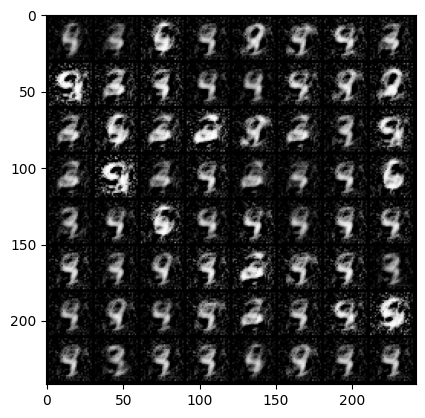

Epoch [57/80] Batch 0/938             Loss D: 0.1720, Loss G: 6.6979
Epoch [57/80] Batch 100/938             Loss D: 0.3217, Loss G: 3.8672
Epoch [57/80] Batch 200/938             Loss D: 0.1138, Loss G: 4.4634
Epoch [57/80] Batch 300/938             Loss D: 0.3509, Loss G: 4.9998
Epoch [57/80] Batch 400/938             Loss D: 0.5267, Loss G: 5.0088
Epoch [57/80] Batch 500/938             Loss D: 0.3369, Loss G: 4.5649
Epoch [57/80] Batch 600/938             Loss D: 0.2293, Loss G: 5.3701
Epoch [57/80] Batch 700/938             Loss D: 0.2009, Loss G: 4.4086
Epoch [57/80] Batch 800/938             Loss D: 0.1268, Loss G: 4.3195
Epoch [57/80] Batch 900/938             Loss D: 0.4608, Loss G: 3.2640


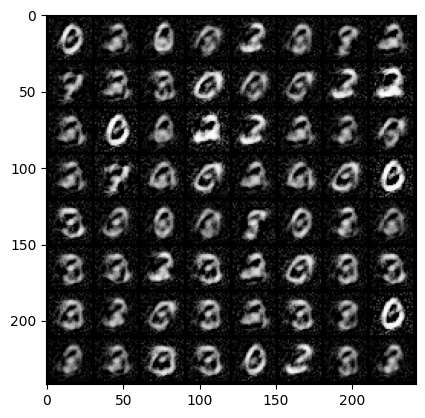

Epoch [58/80] Batch 0/938             Loss D: 0.3209, Loss G: 3.3312
Epoch [58/80] Batch 100/938             Loss D: 0.1940, Loss G: 4.4746
Epoch [58/80] Batch 200/938             Loss D: 0.4994, Loss G: 3.9069
Epoch [58/80] Batch 300/938             Loss D: 0.2303, Loss G: 4.8913
Epoch [58/80] Batch 400/938             Loss D: 0.2376, Loss G: 4.5330
Epoch [58/80] Batch 500/938             Loss D: 0.4509, Loss G: 4.0801
Epoch [58/80] Batch 600/938             Loss D: 0.1177, Loss G: 4.7056
Epoch [58/80] Batch 700/938             Loss D: 0.4598, Loss G: 5.8483
Epoch [58/80] Batch 800/938             Loss D: 0.3270, Loss G: 4.5508
Epoch [58/80] Batch 900/938             Loss D: 0.0937, Loss G: 4.1356


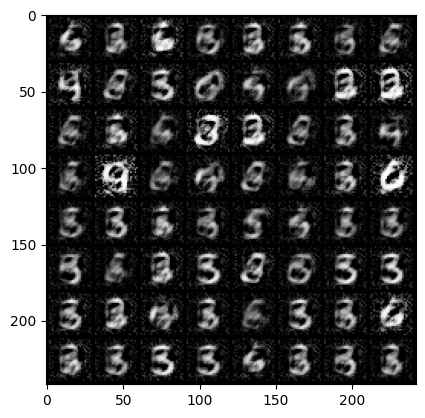

Epoch [59/80] Batch 0/938             Loss D: 0.2239, Loss G: 3.8890
Epoch [59/80] Batch 100/938             Loss D: 0.4581, Loss G: 4.4104
Epoch [59/80] Batch 200/938             Loss D: 0.2248, Loss G: 5.2806
Epoch [59/80] Batch 300/938             Loss D: 0.2538, Loss G: 4.3593
Epoch [59/80] Batch 400/938             Loss D: 0.3312, Loss G: 5.1036
Epoch [59/80] Batch 500/938             Loss D: 0.1869, Loss G: 4.7992
Epoch [59/80] Batch 600/938             Loss D: 0.2361, Loss G: 4.7933
Epoch [59/80] Batch 700/938             Loss D: 0.1923, Loss G: 4.9885
Epoch [59/80] Batch 800/938             Loss D: 0.1352, Loss G: 4.2162
Epoch [59/80] Batch 900/938             Loss D: 0.2454, Loss G: 5.2534


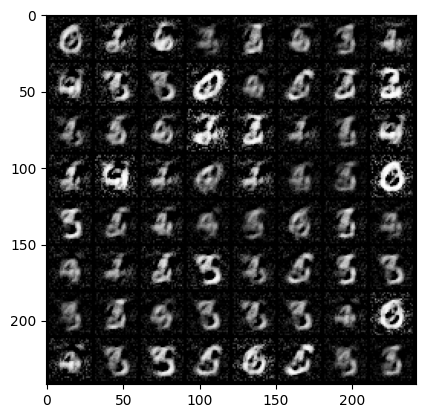

Epoch [60/80] Batch 0/938             Loss D: 0.3349, Loss G: 6.1443
Epoch [60/80] Batch 100/938             Loss D: 0.1727, Loss G: 4.0486
Epoch [60/80] Batch 200/938             Loss D: 0.1617, Loss G: 3.7642
Epoch [60/80] Batch 300/938             Loss D: 0.3457, Loss G: 6.0476
Epoch [60/80] Batch 400/938             Loss D: 0.1982, Loss G: 3.7127
Epoch [60/80] Batch 500/938             Loss D: 0.1157, Loss G: 5.1275
Epoch [60/80] Batch 600/938             Loss D: 0.2572, Loss G: 4.4390
Epoch [60/80] Batch 700/938             Loss D: 0.1420, Loss G: 3.8635
Epoch [60/80] Batch 800/938             Loss D: 0.1726, Loss G: 5.0869
Epoch [60/80] Batch 900/938             Loss D: 0.2937, Loss G: 4.7976


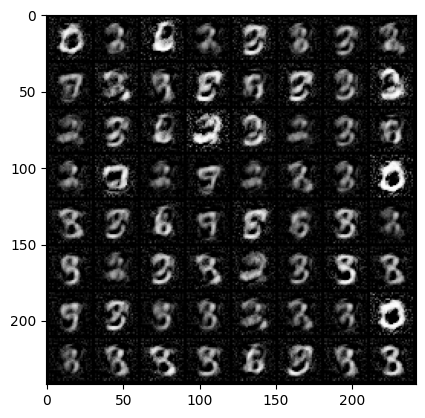

Epoch [61/80] Batch 0/938             Loss D: 0.3343, Loss G: 3.6174
Epoch [61/80] Batch 100/938             Loss D: 0.1298, Loss G: 3.8853
Epoch [61/80] Batch 200/938             Loss D: 0.0619, Loss G: 5.2441
Epoch [61/80] Batch 300/938             Loss D: 0.2527, Loss G: 4.4085
Epoch [61/80] Batch 400/938             Loss D: 0.2320, Loss G: 4.7381
Epoch [61/80] Batch 500/938             Loss D: 0.1200, Loss G: 4.4671
Epoch [61/80] Batch 600/938             Loss D: 0.3116, Loss G: 4.5489
Epoch [61/80] Batch 700/938             Loss D: 0.6183, Loss G: 3.6973
Epoch [61/80] Batch 800/938             Loss D: 0.2987, Loss G: 4.0956
Epoch [61/80] Batch 900/938             Loss D: 0.3274, Loss G: 3.5799


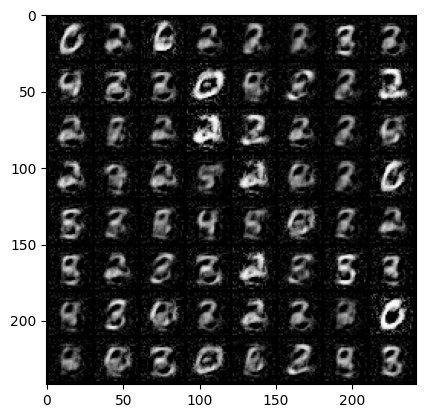

Epoch [62/80] Batch 0/938             Loss D: 0.2001, Loss G: 3.7598
Epoch [62/80] Batch 100/938             Loss D: 0.3260, Loss G: 4.0595
Epoch [62/80] Batch 200/938             Loss D: 0.2125, Loss G: 5.5386
Epoch [62/80] Batch 300/938             Loss D: 0.3738, Loss G: 4.1461
Epoch [62/80] Batch 400/938             Loss D: 0.3595, Loss G: 4.5083
Epoch [62/80] Batch 500/938             Loss D: 0.1724, Loss G: 4.1388
Epoch [62/80] Batch 600/938             Loss D: 0.3677, Loss G: 3.3742
Epoch [62/80] Batch 700/938             Loss D: 0.2154, Loss G: 5.9605
Epoch [62/80] Batch 800/938             Loss D: 0.3452, Loss G: 3.5942
Epoch [62/80] Batch 900/938             Loss D: 0.3391, Loss G: 4.6364


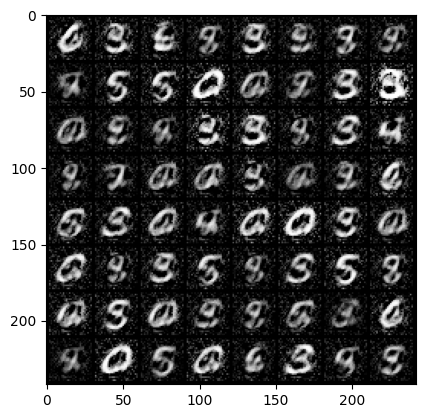

Epoch [63/80] Batch 0/938             Loss D: 0.3475, Loss G: 5.2332
Epoch [63/80] Batch 100/938             Loss D: 0.1914, Loss G: 4.4742
Epoch [63/80] Batch 200/938             Loss D: 0.1249, Loss G: 4.6514
Epoch [63/80] Batch 300/938             Loss D: 0.2453, Loss G: 4.4704
Epoch [63/80] Batch 400/938             Loss D: 0.2173, Loss G: 4.5795
Epoch [63/80] Batch 500/938             Loss D: 0.1336, Loss G: 4.6933
Epoch [63/80] Batch 600/938             Loss D: 0.1242, Loss G: 5.2090
Epoch [63/80] Batch 700/938             Loss D: 0.2605, Loss G: 5.4290
Epoch [63/80] Batch 800/938             Loss D: 0.4497, Loss G: 3.9335
Epoch [63/80] Batch 900/938             Loss D: 0.3419, Loss G: 3.3520


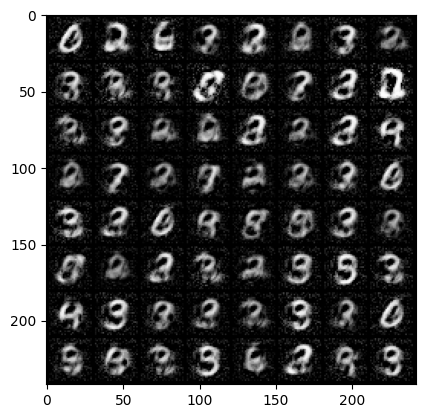

Epoch [64/80] Batch 0/938             Loss D: 0.1345, Loss G: 4.4951
Epoch [64/80] Batch 100/938             Loss D: 0.3158, Loss G: 4.7194
Epoch [64/80] Batch 200/938             Loss D: 0.1027, Loss G: 4.5043
Epoch [64/80] Batch 300/938             Loss D: 0.3235, Loss G: 4.2878
Epoch [64/80] Batch 400/938             Loss D: 0.3435, Loss G: 3.7851
Epoch [64/80] Batch 500/938             Loss D: 0.4309, Loss G: 5.3595
Epoch [64/80] Batch 600/938             Loss D: 0.5128, Loss G: 4.5845
Epoch [64/80] Batch 700/938             Loss D: 0.3819, Loss G: 5.1024
Epoch [64/80] Batch 800/938             Loss D: 0.1830, Loss G: 4.6846
Epoch [64/80] Batch 900/938             Loss D: 0.2974, Loss G: 4.2278


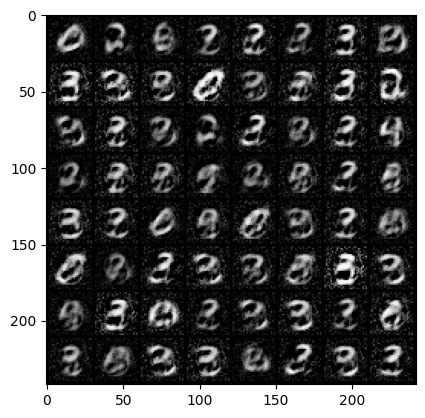

Epoch [65/80] Batch 0/938             Loss D: 0.2483, Loss G: 4.1174
Epoch [65/80] Batch 100/938             Loss D: 0.2504, Loss G: 3.7991
Epoch [65/80] Batch 200/938             Loss D: 0.4314, Loss G: 3.8564
Epoch [65/80] Batch 300/938             Loss D: 0.3185, Loss G: 3.9403
Epoch [65/80] Batch 400/938             Loss D: 0.1836, Loss G: 4.3942
Epoch [65/80] Batch 500/938             Loss D: 0.2200, Loss G: 4.0236
Epoch [65/80] Batch 600/938             Loss D: 0.3515, Loss G: 3.2596
Epoch [65/80] Batch 700/938             Loss D: 0.2851, Loss G: 4.8894
Epoch [65/80] Batch 800/938             Loss D: 0.2185, Loss G: 3.6053
Epoch [65/80] Batch 900/938             Loss D: 0.1757, Loss G: 5.5295


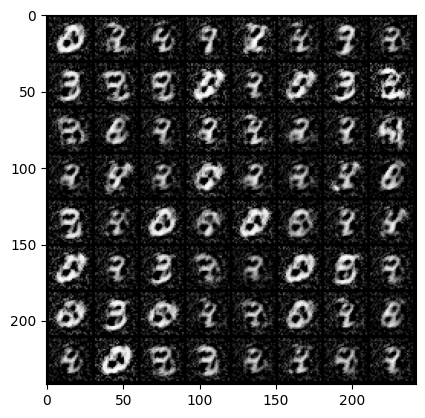

Epoch [66/80] Batch 0/938             Loss D: 0.3311, Loss G: 5.3885
Epoch [66/80] Batch 100/938             Loss D: 0.3384, Loss G: 3.6592
Epoch [66/80] Batch 200/938             Loss D: 0.2891, Loss G: 4.2156
Epoch [66/80] Batch 300/938             Loss D: 0.2471, Loss G: 5.1665
Epoch [66/80] Batch 400/938             Loss D: 0.1580, Loss G: 4.5878
Epoch [66/80] Batch 500/938             Loss D: 0.1711, Loss G: 4.3839
Epoch [66/80] Batch 600/938             Loss D: 0.1227, Loss G: 4.7566
Epoch [66/80] Batch 700/938             Loss D: 0.2257, Loss G: 4.0492
Epoch [66/80] Batch 800/938             Loss D: 0.2719, Loss G: 5.2869
Epoch [66/80] Batch 900/938             Loss D: 0.1528, Loss G: 5.0723


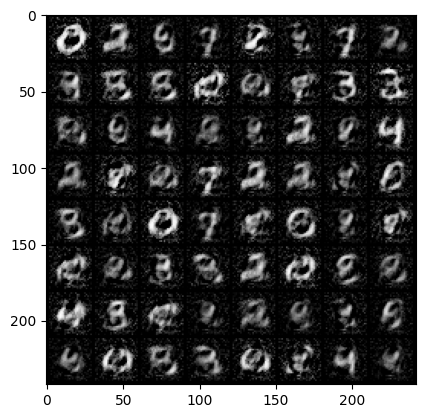

Epoch [67/80] Batch 0/938             Loss D: 0.3920, Loss G: 3.4065
Epoch [67/80] Batch 100/938             Loss D: 0.4760, Loss G: 4.6934
Epoch [67/80] Batch 200/938             Loss D: 0.3155, Loss G: 5.0582
Epoch [67/80] Batch 300/938             Loss D: 0.1813, Loss G: 4.6716
Epoch [67/80] Batch 400/938             Loss D: 0.3919, Loss G: 4.2997
Epoch [67/80] Batch 500/938             Loss D: 0.3208, Loss G: 4.3077
Epoch [67/80] Batch 600/938             Loss D: 0.2360, Loss G: 4.2800
Epoch [67/80] Batch 700/938             Loss D: 0.2975, Loss G: 4.6568
Epoch [67/80] Batch 800/938             Loss D: 0.2339, Loss G: 4.7179
Epoch [67/80] Batch 900/938             Loss D: 0.1129, Loss G: 3.9205


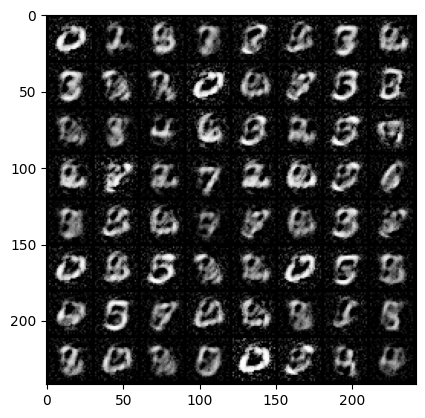

Epoch [68/80] Batch 0/938             Loss D: 0.1788, Loss G: 4.2466
Epoch [68/80] Batch 100/938             Loss D: 0.3064, Loss G: 5.2662
Epoch [68/80] Batch 200/938             Loss D: 0.6246, Loss G: 3.5998
Epoch [68/80] Batch 300/938             Loss D: 0.2763, Loss G: 3.9627
Epoch [68/80] Batch 400/938             Loss D: 0.1765, Loss G: 4.4374
Epoch [68/80] Batch 500/938             Loss D: 0.2809, Loss G: 3.7541
Epoch [68/80] Batch 600/938             Loss D: 0.1633, Loss G: 4.7902
Epoch [68/80] Batch 700/938             Loss D: 0.3277, Loss G: 3.9224
Epoch [68/80] Batch 800/938             Loss D: 0.2473, Loss G: 3.7934
Epoch [68/80] Batch 900/938             Loss D: 0.2341, Loss G: 4.8547


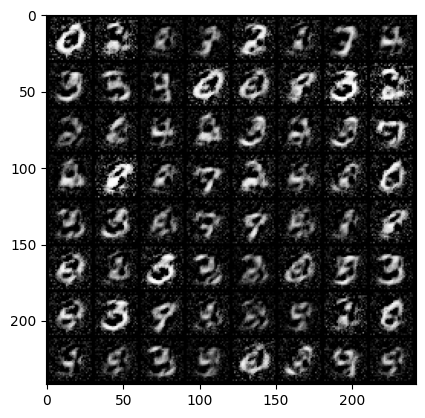

Epoch [69/80] Batch 0/938             Loss D: 0.1292, Loss G: 4.9316
Epoch [69/80] Batch 100/938             Loss D: 0.3471, Loss G: 3.8193
Epoch [69/80] Batch 200/938             Loss D: 0.3702, Loss G: 4.0885
Epoch [69/80] Batch 300/938             Loss D: 0.2149, Loss G: 4.0554
Epoch [69/80] Batch 400/938             Loss D: 0.2363, Loss G: 5.0228
Epoch [69/80] Batch 500/938             Loss D: 0.3418, Loss G: 3.5390
Epoch [69/80] Batch 600/938             Loss D: 0.3352, Loss G: 4.1483
Epoch [69/80] Batch 700/938             Loss D: 0.3899, Loss G: 3.6210
Epoch [69/80] Batch 800/938             Loss D: 0.2520, Loss G: 3.4908
Epoch [69/80] Batch 900/938             Loss D: 0.1508, Loss G: 3.9491


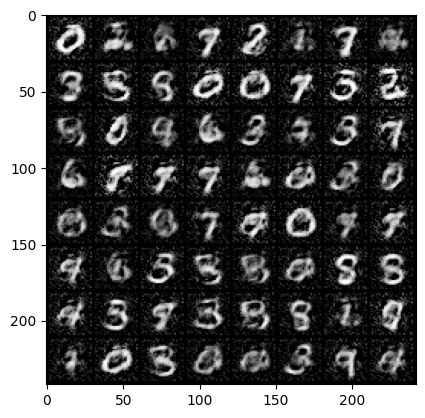

Epoch [70/80] Batch 0/938             Loss D: 0.2226, Loss G: 3.2267
Epoch [70/80] Batch 100/938             Loss D: 0.4231, Loss G: 3.4133
Epoch [70/80] Batch 200/938             Loss D: 0.2487, Loss G: 4.3291
Epoch [70/80] Batch 300/938             Loss D: 0.3525, Loss G: 4.1897
Epoch [70/80] Batch 400/938             Loss D: 0.2454, Loss G: 4.3584
Epoch [70/80] Batch 500/938             Loss D: 0.4181, Loss G: 4.2096
Epoch [70/80] Batch 600/938             Loss D: 0.2869, Loss G: 3.8737
Epoch [70/80] Batch 700/938             Loss D: 0.3266, Loss G: 3.9545
Epoch [70/80] Batch 800/938             Loss D: 0.1835, Loss G: 3.8875
Epoch [70/80] Batch 900/938             Loss D: 0.4311, Loss G: 4.6529


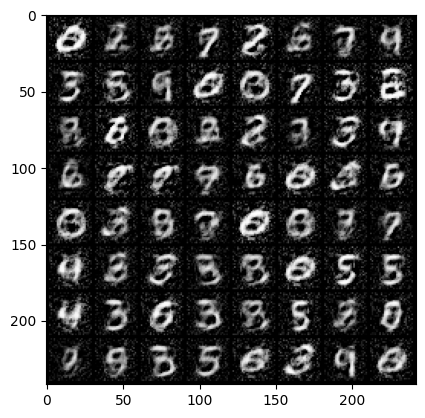

Epoch [71/80] Batch 0/938             Loss D: 0.4115, Loss G: 4.2010
Epoch [71/80] Batch 100/938             Loss D: 0.0773, Loss G: 4.5554
Epoch [71/80] Batch 200/938             Loss D: 0.4158, Loss G: 4.2598
Epoch [71/80] Batch 300/938             Loss D: 0.3155, Loss G: 3.9552
Epoch [71/80] Batch 400/938             Loss D: 0.2812, Loss G: 4.0662
Epoch [71/80] Batch 500/938             Loss D: 0.2916, Loss G: 5.1342
Epoch [71/80] Batch 600/938             Loss D: 0.2351, Loss G: 4.2042
Epoch [71/80] Batch 700/938             Loss D: 0.2811, Loss G: 4.1552
Epoch [71/80] Batch 800/938             Loss D: 0.1235, Loss G: 4.3011
Epoch [71/80] Batch 900/938             Loss D: 0.3077, Loss G: 4.0102


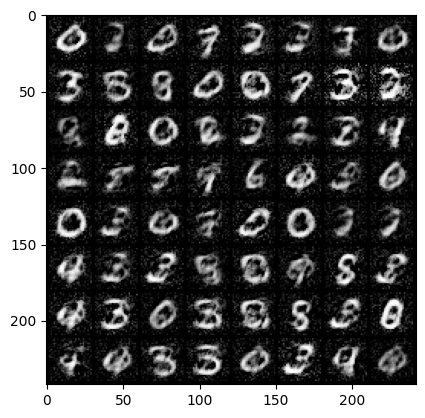

Epoch [72/80] Batch 0/938             Loss D: 0.3074, Loss G: 4.1563
Epoch [72/80] Batch 100/938             Loss D: 0.5873, Loss G: 4.4974
Epoch [72/80] Batch 200/938             Loss D: 0.2959, Loss G: 4.3428
Epoch [72/80] Batch 300/938             Loss D: 0.3758, Loss G: 3.9677
Epoch [72/80] Batch 400/938             Loss D: 0.3333, Loss G: 5.8473
Epoch [72/80] Batch 500/938             Loss D: 0.2616, Loss G: 3.6534
Epoch [72/80] Batch 600/938             Loss D: 0.2253, Loss G: 4.4274
Epoch [72/80] Batch 700/938             Loss D: 0.2270, Loss G: 3.9845
Epoch [72/80] Batch 800/938             Loss D: 0.3444, Loss G: 4.2572
Epoch [72/80] Batch 900/938             Loss D: 0.2181, Loss G: 3.9955


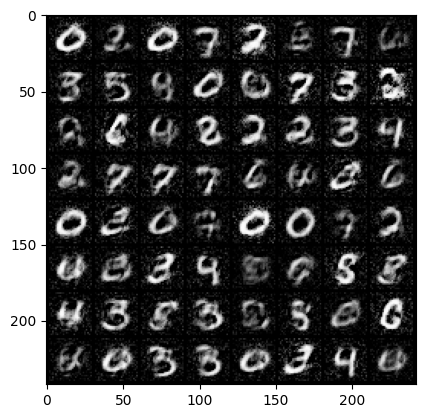

Epoch [73/80] Batch 0/938             Loss D: 0.4647, Loss G: 4.0072
Epoch [73/80] Batch 100/938             Loss D: 0.3301, Loss G: 3.2381
Epoch [73/80] Batch 200/938             Loss D: 0.5008, Loss G: 3.7801
Epoch [73/80] Batch 300/938             Loss D: 0.2488, Loss G: 3.8876
Epoch [73/80] Batch 400/938             Loss D: 0.3638, Loss G: 4.3876
Epoch [73/80] Batch 500/938             Loss D: 0.4769, Loss G: 2.8846
Epoch [73/80] Batch 600/938             Loss D: 0.2194, Loss G: 4.4052
Epoch [73/80] Batch 700/938             Loss D: 0.2913, Loss G: 4.6018
Epoch [73/80] Batch 800/938             Loss D: 0.3243, Loss G: 3.3985
Epoch [73/80] Batch 900/938             Loss D: 0.3934, Loss G: 3.9043


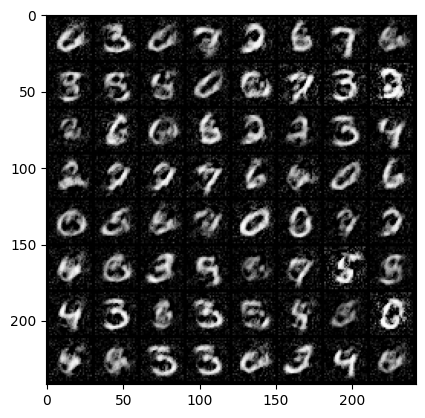

Epoch [74/80] Batch 0/938             Loss D: 0.3294, Loss G: 3.8859
Epoch [74/80] Batch 100/938             Loss D: 0.3131, Loss G: 3.4025
Epoch [74/80] Batch 200/938             Loss D: 0.3750, Loss G: 3.7114
Epoch [74/80] Batch 300/938             Loss D: 0.3624, Loss G: 4.1440
Epoch [74/80] Batch 400/938             Loss D: 0.3458, Loss G: 3.4143
Epoch [74/80] Batch 500/938             Loss D: 0.2198, Loss G: 4.2243
Epoch [74/80] Batch 600/938             Loss D: 0.3560, Loss G: 4.1653
Epoch [74/80] Batch 700/938             Loss D: 0.3622, Loss G: 3.9284
Epoch [74/80] Batch 800/938             Loss D: 0.3326, Loss G: 5.0656
Epoch [74/80] Batch 900/938             Loss D: 0.3014, Loss G: 3.8945


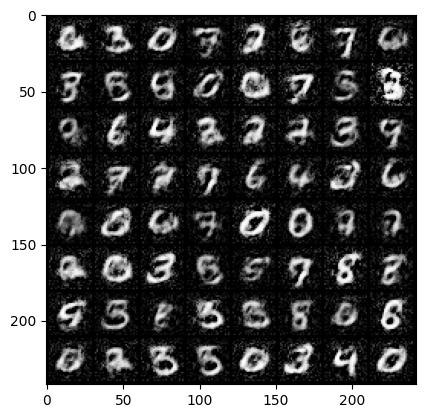

Epoch [75/80] Batch 0/938             Loss D: 0.3354, Loss G: 3.4700
Epoch [75/80] Batch 100/938             Loss D: 0.4907, Loss G: 3.7402
Epoch [75/80] Batch 200/938             Loss D: 0.2916, Loss G: 3.6223
Epoch [75/80] Batch 300/938             Loss D: 0.4161, Loss G: 3.8371
Epoch [75/80] Batch 400/938             Loss D: 0.3088, Loss G: 4.3450
Epoch [75/80] Batch 500/938             Loss D: 0.3216, Loss G: 4.5077
Epoch [75/80] Batch 600/938             Loss D: 0.2821, Loss G: 4.7958
Epoch [75/80] Batch 700/938             Loss D: 0.2199, Loss G: 3.5404
Epoch [75/80] Batch 800/938             Loss D: 0.5334, Loss G: 4.3481
Epoch [75/80] Batch 900/938             Loss D: 0.5097, Loss G: 3.6683


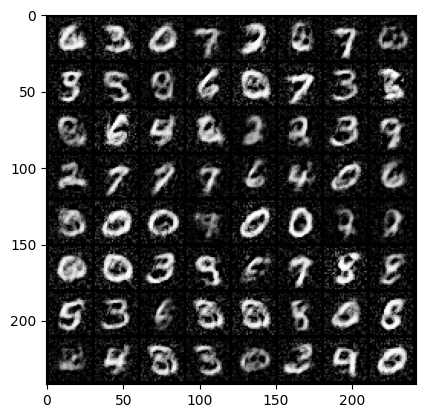

Epoch [76/80] Batch 0/938             Loss D: 0.2171, Loss G: 3.7267
Epoch [76/80] Batch 100/938             Loss D: 0.2610, Loss G: 4.0459
Epoch [76/80] Batch 200/938             Loss D: 0.7421, Loss G: 3.4418
Epoch [76/80] Batch 300/938             Loss D: 0.2672, Loss G: 4.0767
Epoch [76/80] Batch 400/938             Loss D: 0.3523, Loss G: 3.3784
Epoch [76/80] Batch 500/938             Loss D: 0.3663, Loss G: 3.9130
Epoch [76/80] Batch 600/938             Loss D: 0.3754, Loss G: 3.3860
Epoch [76/80] Batch 700/938             Loss D: 0.2143, Loss G: 3.5860
Epoch [76/80] Batch 800/938             Loss D: 0.3682, Loss G: 3.5586
Epoch [76/80] Batch 900/938             Loss D: 0.3389, Loss G: 3.5974


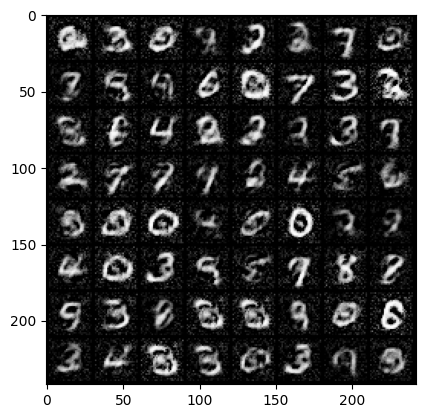

Epoch [77/80] Batch 0/938             Loss D: 0.3169, Loss G: 3.9101
Epoch [77/80] Batch 100/938             Loss D: 0.2764, Loss G: 4.5064
Epoch [77/80] Batch 200/938             Loss D: 0.3681, Loss G: 3.6485
Epoch [77/80] Batch 300/938             Loss D: 0.3578, Loss G: 4.0060
Epoch [77/80] Batch 400/938             Loss D: 0.2382, Loss G: 4.1967
Epoch [77/80] Batch 500/938             Loss D: 0.2714, Loss G: 3.4358
Epoch [77/80] Batch 600/938             Loss D: 0.3219, Loss G: 3.6954
Epoch [77/80] Batch 700/938             Loss D: 0.5338, Loss G: 4.1207
Epoch [77/80] Batch 800/938             Loss D: 0.1794, Loss G: 4.5552
Epoch [77/80] Batch 900/938             Loss D: 0.3300, Loss G: 3.8782


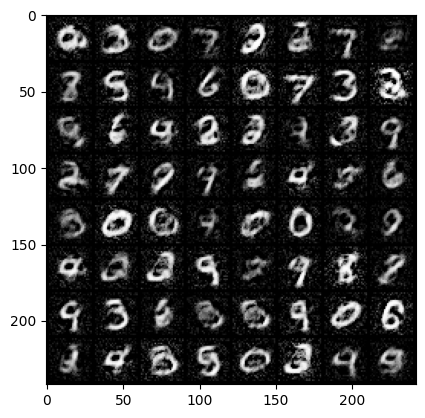

Epoch [78/80] Batch 0/938             Loss D: 0.3856, Loss G: 4.0222
Epoch [78/80] Batch 100/938             Loss D: 0.2377, Loss G: 3.3899
Epoch [78/80] Batch 200/938             Loss D: 0.2426, Loss G: 3.6629
Epoch [78/80] Batch 300/938             Loss D: 0.2512, Loss G: 4.4322
Epoch [78/80] Batch 400/938             Loss D: 0.2493, Loss G: 4.1795
Epoch [78/80] Batch 500/938             Loss D: 0.3063, Loss G: 4.1175
Epoch [78/80] Batch 600/938             Loss D: 0.2045, Loss G: 3.8702
Epoch [78/80] Batch 700/938             Loss D: 0.2276, Loss G: 5.3933
Epoch [78/80] Batch 800/938             Loss D: 0.3018, Loss G: 4.5472
Epoch [78/80] Batch 900/938             Loss D: 0.3772, Loss G: 3.3706


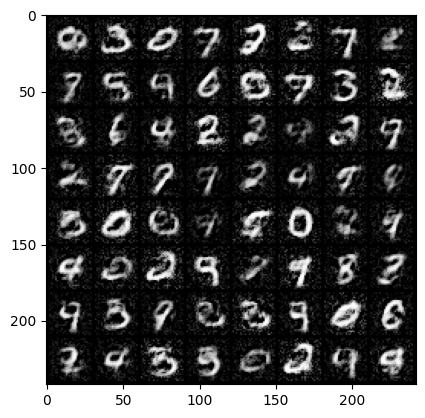

Epoch [79/80] Batch 0/938             Loss D: 0.3927, Loss G: 3.3813
Epoch [79/80] Batch 100/938             Loss D: 0.3451, Loss G: 3.9027
Epoch [79/80] Batch 200/938             Loss D: 0.2735, Loss G: 4.0780
Epoch [79/80] Batch 300/938             Loss D: 0.1995, Loss G: 4.3776
Epoch [79/80] Batch 400/938             Loss D: 0.1532, Loss G: 3.8031
Epoch [79/80] Batch 500/938             Loss D: 0.2932, Loss G: 4.0145
Epoch [79/80] Batch 600/938             Loss D: 0.2271, Loss G: 4.5014
Epoch [79/80] Batch 700/938             Loss D: 0.3183, Loss G: 3.5284
Epoch [79/80] Batch 800/938             Loss D: 0.4233, Loss G: 3.3422
Epoch [79/80] Batch 900/938             Loss D: 0.5551, Loss G: 4.7140


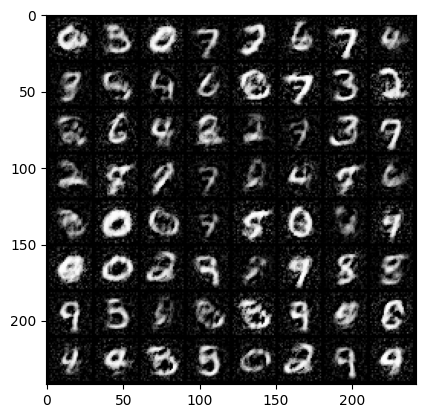

In [31]:
# Setting up the parameter and preparing the data
num_epochs = 80
fixed_noise = torch.randn(64,100) # vector de ruido, batch de 64 samples, tamaño de 100

# itera sobre los batches de data en trainloader, i es el indice del batch actual en cada iteracion,
# permite conocer la posicion en el loop, data es el batch de las imagenes, _ es el label correspondiente, es como ignorar el label en el trainloader
for epoch in range(num_epochs): # iteracion sobre el numero de epocas
  for i,(data,_) in enumerate(trainloader):
    real_data = data
    batch_size = real_data.size(0)

    # train the discriminator
    # generar fake data
    noise = torch.randn(batch_size,100)
    fake_data = generator(noise)
    # crear dos vectores con el tamaño del batch 1 real 0 fake
    label_real = torch.full((batch_size,),1,dtype=torch.float) # son los parametros real y fake, tamaño del batch, 1 si es real
    label_fake = torch.full((batch_size,),0,dtype=torch.float)
    # aqui se pasa el data real que se creo antes con el discriminador y se comapara con label_real para calcular la perdida real del discriminador
    output_real = discriminator(real_data).view(-1) # aqui el discriminador recibe data real, real_data
    lossD_real = criterion(output_real, label_real)

    # fake data
    # aqui se esta pasando fake data al discriminador -1 es para 1 dimension
    output_fake = discriminator(fake_data.detach()).view(-1) # detach es para el fujo gradiente al generador
    lossD_fake = criterion(output_fake, label_fake)
    # perdida del discriminador
    lossD = lossD_real + lossD_fake
    # minimizar la perdida con el optimizador previamente definido
    OptimizerD.zero_grad()
    lossD.backward()  # optimizar la perdida en backward la cual se propaga para calcular el gradiente
    OptimizerD.step() # step actualiza los pesos del discriminador usando los gradientes calculados


    # train the generator
    output_fake = discriminator(fake_data).view(-1)
    lossG = criterion(output_fake, label_real) # calcular la perdida del generator, minimizar la fake image con la real
    OptimizerG.zero_grad() # backpropagar los nuevos gradientes yd ejar en cero los antiguos, solo los gradientes del forward actual, pasa para contribuir a la actualizacion
    lossG.backward()  #
    OptimizerG.step() #

    # Visualizar los resultados
    if i % 100 == 0: # con esto se asegura que el print se ejecuta cada 100 batches
      print(f'Epoch [{epoch}/{num_epochs}] Batch {i}/{len(trainloader)} \
            Loss D: {lossD.item():.4f}, Loss G: {lossG.item():.4f}')

  with torch.no_grad(): # visualizar despues de cada epoch, con esto se visualizan los resultados
    fake_images = generator(fixed_noise).detach() # fixed_noise es para generar la misma imagen cada vez q se ejecuta este codigo
  img_grid = torchvision.utils.make_grid(fake_images) # (channel, height, width)
  np_img = img_grid.numpy() # img_grid e sun tensor y se esta pasando a vector
  plt.imshow(np.transpose(np_img,(1,2,0))) # numpy lo entiende asi Height, width, channel
  plt.show()



1. **What is the key difference between the loss functions used in traditional GANs and WGANs, and how does this difference affect the training process?**

In traditional GANs, the loss functions use binary cross-entropy, which aims to make the Discriminator classify real and fake data as either 1 or 0. In WGANs, the Wasserstein loss is used, which measures the "distance" between real and fake distributions. The key difference is that WGANs aim to minimize the Wasserstein distance, which provides a smoother gradient, helping stabilize training. Specifically, the Discriminator loss is the difference between the real and fake outputs, and the Generator loss is the negative of the fake output. This change reduces issues like vanishing gradients, making the model easier to train and more effective.

2. **Why is weight clipping important in WGANs, and how is it implemented in PyTorch?**

Weight clipping is crucial in WGANs ensuring that the model behaves in a stable manner. Without this, the Discriminator might output extreme values, destabilizing the training process. Weight clipping constrains the Discriminator's weights to a small range (e.g., [-0.01, 0.01]), limiting the capacity of the Discriminator to avoid overfitting to the data.
In PyTorch, weight clipping is implemented by iterating over the Discriminator's parameters and using .data.clamp_() to restrict the weights within a specified range. This keeps the Discriminator's output within bounds, ensuring smooth and stable updates during training.